# Evaluation of k$_{Si}$ parameter variation
# Half-saturation constant diatom Si uptake

#### Control: run 'mo5', k$_{Si}$ = 4.0, pacific hydrothermal vent masked

run 'mo4', k$_{Si}$ = 4.0, pacific hydrothermal vent NOT masked

run 'mo10', k$_{Si}$ = 3.5, pacific hydrothermal vent masked

run 'mo11', k$_{Si}$ = 4.5, pacific hydrothermal vent masked

In [2]:
%autosave 5
%matplotlib inline

Autosaving every 5 seconds


# To do
#### Include Datasets
isibhv/projects: OCCCI


In [3]:
import pyfesom2 as pf
import math
import numpy as np
import matplotlib.pylab as plt
import matplotlib.cm as cm
from matplotlib import gridspec
from netCDF4 import Dataset
import time
from datetime import date
import cartopy.crs as ccrs
import pangaeapy.pandataset as pd

import skill_metrics as sm
from plot_Taylor_normalized import plt_Taylor_norm

!jupyter nbconvert --to=python F2R_sensitivity_toolbox.ipynb
import F2R_sensitivity_toolbox as stx

import warnings
warnings.filterwarnings('ignore')

[NbConvertApp] Converting notebook F2R_sensitivity_toolbox.ipynb to python
[NbConvertApp] Writing 40255 bytes to F2R_sensitivity_toolbox.py


In [4]:
# mesh ------------------------------------------------------------------------------------
meshpath = '/work/ollie/mozeisin/mesh/mesh_fesom2.0/core2_meanz'

# list of runs ------------------------------------------------------------------------------------
# first run speciefied is used as control run
resultpath = '/work/ollie/mozeisin/results/f2r1.2'
path_list = '/mo5', '/mo4', '/mo10', '/mo11'
resultpath = [resultpath +i for i in path_list]

# corresponding runid of FESOM runs
idlist = ('fesom', 'fesom', 'fesom', 'fesom') 
# see corresponding plotting labels below

# props of analysis ------------------------------------------------------------------------------------
# analysing fesom parameter
fesom_parameter = 'kSi'

first_year = 1951
last_year = 1957
years = [first_year, last_year]

depth=0

# props of plotting ------------------------------------------------------------------------------------
#pc = ccrs.PlateCarree()
#rob = ccrs.Robinson()
mapproj = 'pc'

# label used for plotting
figlabel = ('CTRL (k$_{Si}$ = 4.0)', 'CTRL (without mask)', 'k$_{Si}$ = 3.5', 'k$_{Si}$ = 4.5') 

# labels used for saving output
savelabel = ('CTRL_kSi_40','CTRL_woMask_kSi_40','kSi_35','kSi_45')

# rows and columns for subplots
rowscol = (2,2)

# export of analysis ------------------------------------------------------------------------------------
savefig = True

savepath = '/home/ollie/mozeisin/evaluation/mo_files/F2R_sensitivity/'

today = date.today().strftime("_%Y_%m_%d")
htmlname     =  'F2R_sensitivity_' + fesom_parameter + '_' + today +'.html'
htmlpath = '/home/ollie/mozeisin/evaluation/mo_files/html/'

# initialization file specifications -----------------------------------------------------------
ncfileMaredat = "/home/ollie/mozeisin/obs/MarEDat/MarEDat20120716Diatoms.nc"

#obspath      = '/home/ollie/mseifert/py_fesom/CreateRunFiles/Initialization/Output/'

#ncfileAlk                = '/work/ollie/projects/MarESys/evaluation/GLODAPv2.2016b.TAlk.nc'
#ncfileDIC                = '/work/ollie/projects/MarESys/evaluation/GLODAPv2.2016b.TCO2.nc'
#ncfileDSi                = '/work/ollie/projects/MarESys/evaluation/woa13_all_i00_01.nc'
ncfileDIN                = '/work/ollie/projects/MarESys/evaluation/woa13_all_n00_01.nc'
#ncfileDO2                = '/work/ollie/projects/MarESys/evaluation/woa18_all_o00_01.nc'
#ncfileDFe                = '/work/ollie/projects/MarESys/evaluation/fe_pisces_opa_eq_init_3D.nc' 
#ncfileNPPTotalGlobal     = '/work/ollie/projects/MarESys/evaluation/'+'fesom.initial.mesh.diag.nc'
#ncfileCO2fluxTotalGlobal = '/work/ollie/projects/MarESys/evaluation/'+'fesom.initial.mesh.diag.nc'
#ncfileTemp               = '/work/ollie/projects/MarESys/evaluation/woa18_decav_t00_01.nc'
#ncfileSal                = '/work/ollie/projects/MarESys/evaluation/woa18_decav_s00_01.nc'
#ncfilepCO2               = '/work/ollie/projects/MarESys/evaluation/SOCATv6_tracks_gridded_monthly.nc'
#ncfileMLD                = '/work/ollie/projects/MarESys/evaluation/mld_DR003.nc'
matfileChlsurf           = '/work/ollie/projects/MarESys/evaluation/climatology_annual_chl_1deg_OCCCI_2012_2015.mat'
#txtfileCO2flux           = '/work/ollie/projects/MarESys/evaluation/CO2_flux2015_Takahashietal2009_original.txt'


#### quickly check input

In [5]:
resultpath

['/work/ollie/mozeisin/results/f2r1.2/mo5',
 '/work/ollie/mozeisin/results/f2r1.2/mo4',
 '/work/ollie/mozeisin/results/f2r1.2/mo10',
 '/work/ollie/mozeisin/results/f2r1.2/mo11']

In [6]:
print('Period: {0} to {1}'.format(years[0],years[1]))

Period: 1951 to 1957


In [7]:
# mesh initialization -----------------------------------------------------------
mesh = pf.load_mesh(meshpath)

# load FESOM mesh diag -------------------------------------------------------------------------------
meshdiag= meshpath +'fesom.mesh.diag.nc'
#!ncdump -h $meshdiag

diag = pf.get_meshdiag(mesh)
#print(diag)
#print(diag['Z']) # depth of layers
mesh_depths = diag['Z'].values

stx.check_plot_mesh(mesh, plot_globe = False)

Mesh layer depths:
[-2.500e+00 -7.500e+00 -1.500e+01 -2.500e+01 -3.500e+01 -4.500e+01
 -5.500e+01 -6.500e+01 -7.500e+01 -8.500e+01 -9.500e+01 -1.075e+02
 -1.250e+02 -1.475e+02 -1.750e+02 -2.100e+02 -2.550e+02 -3.100e+02
 -3.750e+02 -4.500e+02 -5.350e+02 -6.300e+02 -7.350e+02 -8.500e+02
 -9.750e+02 -1.110e+03 -1.255e+03 -1.415e+03 -1.600e+03 -1.810e+03
 -2.035e+03 -2.275e+03 -2.525e+03 -2.775e+03 -3.025e+03 -3.275e+03
 -3.525e+03 -3.775e+03 -4.025e+03 -4.275e+03 -4.525e+03 -4.775e+03
 -5.025e+03 -5.275e+03 -5.525e+03 -5.825e+03 -6.125e+03]


# MarEDAT

In [8]:
#!ncdump -h $ncfileMaredat

In [9]:
# load maredat
lat_maredat, lon_maredat, maredat_layered = stx.maredat_load(ncfileMaredat)

Shape of maredat_layered[0]:
(180, 360)


In [10]:
# maredat mean min max of 0-5m
print('MarEDAT mean min max at 0-5m:')
np.nanmean(maredat_layered[0]), np.nanmin(maredat_layered[0]), np.nanmax(maredat_layered[0])

MarEDAT mean min max at 0-5m:


(27.388897, 0.0024, 4154.661)

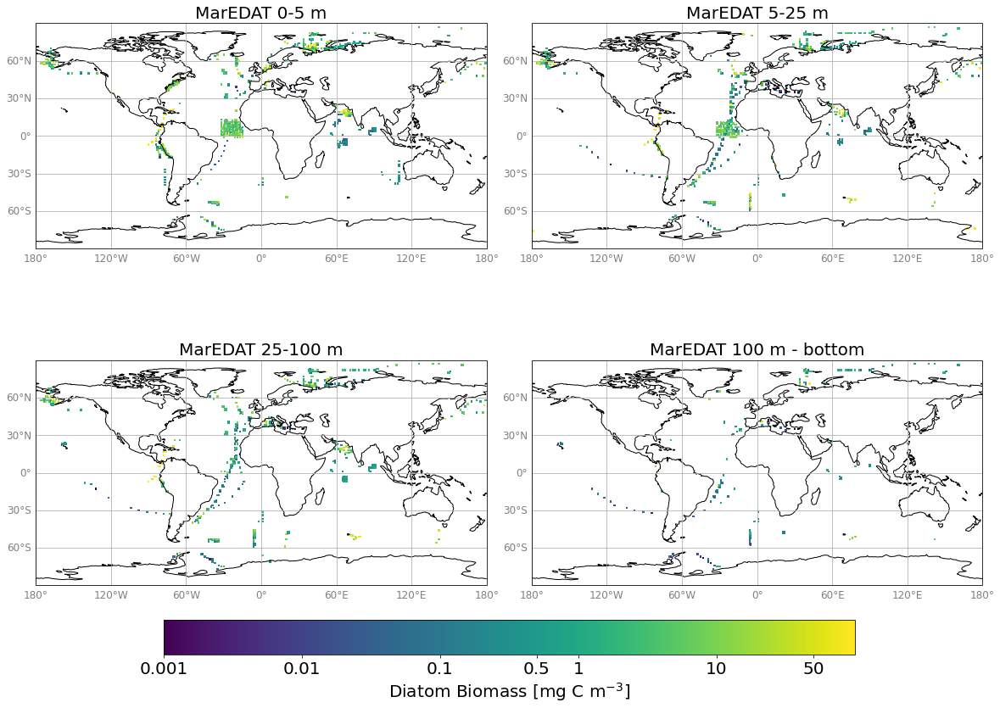

In [11]:
# overview plot: maredat
fig = stx.maredat_overview_plot(maredat_layered,lon_maredat, lat_maredat,mapproj)

# FESOM Diatom carbon

#### - load FESOM data for all specified runs
#### - plot comparison graph for one depth

/work/ollie/mozeisin/results/f2r1.2/mo5
Model depth: 0.0
/work/ollie/mozeisin/results/f2r1.2/mo4
Model depth: 0.0
/work/ollie/mozeisin/results/f2r1.2/mo10
Model depth: 0.0
/work/ollie/mozeisin/results/f2r1.2/mo11
Model depth: 0.0


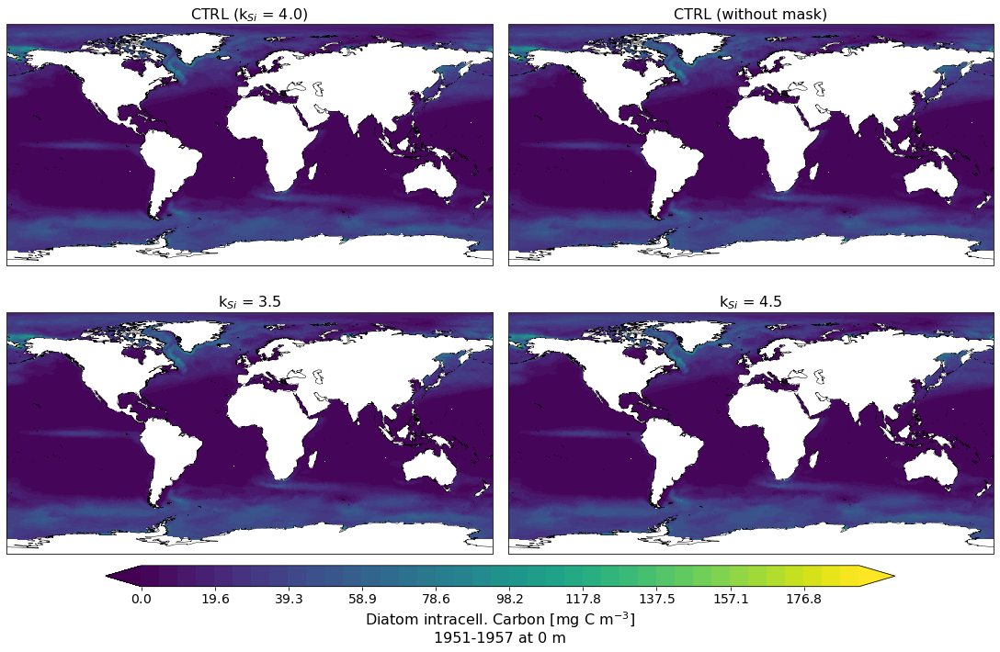

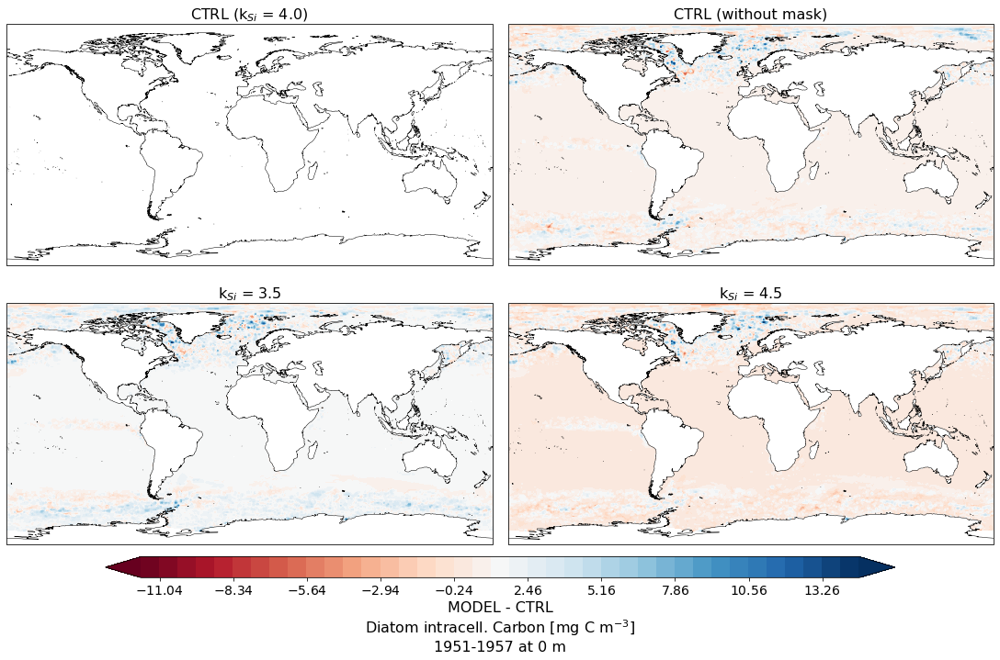

In [12]:
#NCfesom = resultpath[0] + '/DiaC.'+idlist[0]+'.1948.nc' # DiaC:units = "[mmol/m3]"
#!ncdump -h $NCfesom

units = 'Diatom intracell. Carbon [mg C m$^{{-3}}$]\n{0}-{1} at {2} m'.format(years[0],years[1],depth)
#units = 'Intracellular C [mg C m$^{-3}$]'

DiaC = [0]*len(idlist)

for i in range(len(idlist)):
    print(resultpath[i])
    DiaC[i] = pf.get_data(resultpath[i], "DiaC", years, mesh, runid=idlist[i], how="mean", compute=True, depth=depth)
    DiaC[i] = DiaC[i] * 12.01

fig = pf.plot(mesh, [data for data in DiaC], mapproj = mapproj, units=units, cmap = 'viridis',
              rowscol = rowscol, #(math.ceil(len(idlist)/3), 3), 
              figsize = (15,10),
              titles=[title for title in figlabel])

## differences
fig = pf.plot(mesh, [data-DiaC[0] for data in DiaC], mapproj = mapproj, units='MODEL - CTRL\n'+units, 
              rowscol = rowscol, #(math.ceil(len(idlist)/3), 3), 
              figsize = (15,10),
              #levels = (-2.5e-2,2.5e-2, 30), 
              cmap = 'RdBu',
              titles=[title for title in figlabel])

# FESOM comparison to MarEDat

In [13]:
if False:
    print(np.shape(mesh.zlev)) # levels
    print(np.shape(mesh_depths)) # layers

    print(mesh.zlev)
    print(mesh_depths)

#### Interpolating FESOM depth-range-means to 1x1 grid

In [14]:
mo5 = stx.fesom_to_maredat_levels(resultpath[0], idlist[0], years, mesh, lon_maredat, lat_maredat)
mo4 = stx.fesom_to_maredat_levels(resultpath[1], idlist[1], years, mesh, lon_maredat, lat_maredat)
mo6 = stx.fesom_to_maredat_levels(resultpath[2], idlist[2], years, mesh, lon_maredat, lat_maredat)
mo7 = stx.fesom_to_maredat_levels(resultpath[3], idlist[3], years, mesh, lon_maredat, lat_maredat)


Processing /work/ollie/mozeisin/results/f2r1.2/mo5 for years 1951-1957
Depth is None, 3d field will be returned

Depth range 0-5 m
with mean 15.4995 min 0.000234 max 182.9734

Depth range 5-25 m
with mean 14.1803 min 0.000239 max 113.0168

Depth range 25-100 m
with mean 9.8346 min 0.000000 max 39.3457

Depth range 100-100000.0 m
with mean 0.6082 min 0.000000 max 6.0722

Processing /work/ollie/mozeisin/results/f2r1.2/mo4 for years 1951-1957
Depth is None, 3d field will be returned

Depth range 0-5 m
with mean 15.5046 min 0.000232 max 182.6457

Depth range 5-25 m
with mean 14.1849 min 0.000236 max 113.9612

Depth range 25-100 m
with mean 9.8319 min 0.000000 max 39.3472

Depth range 100-100000.0 m
with mean 0.6075 min 0.000000 max 5.9861

Processing /work/ollie/mozeisin/results/f2r1.2/mo10 for years 1951-1957
Depth is None, 3d field will be returned

Depth range 0-5 m
with mean 15.3739 min 0.000234 max 181.2990

Depth range 5-25 m
with mean 14.0655 min 0.000238 max 113.1319

Depth range 

#### Plot runs

CTRL (k$_{Si}$ = 4.0)


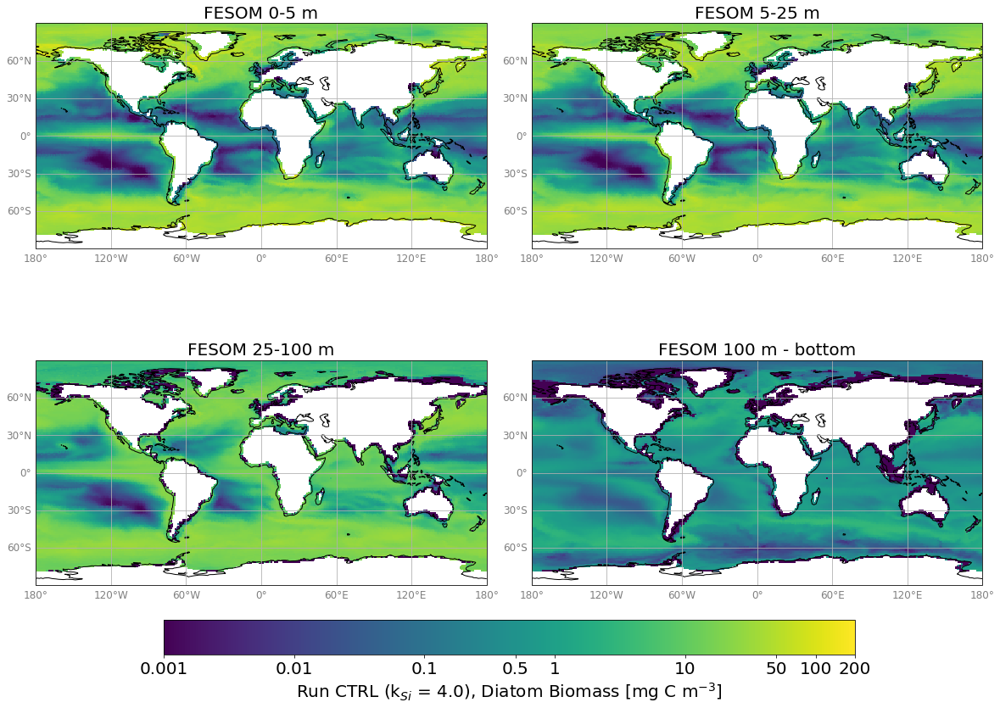

In [15]:
stx.fesom_plot_depths(mo5, figlabel[0], savelabel[0], lon_maredat, lat_maredat, 
                      mapproj, years, savefig=savefig, savepath=savepath)

CTRL (without mask)


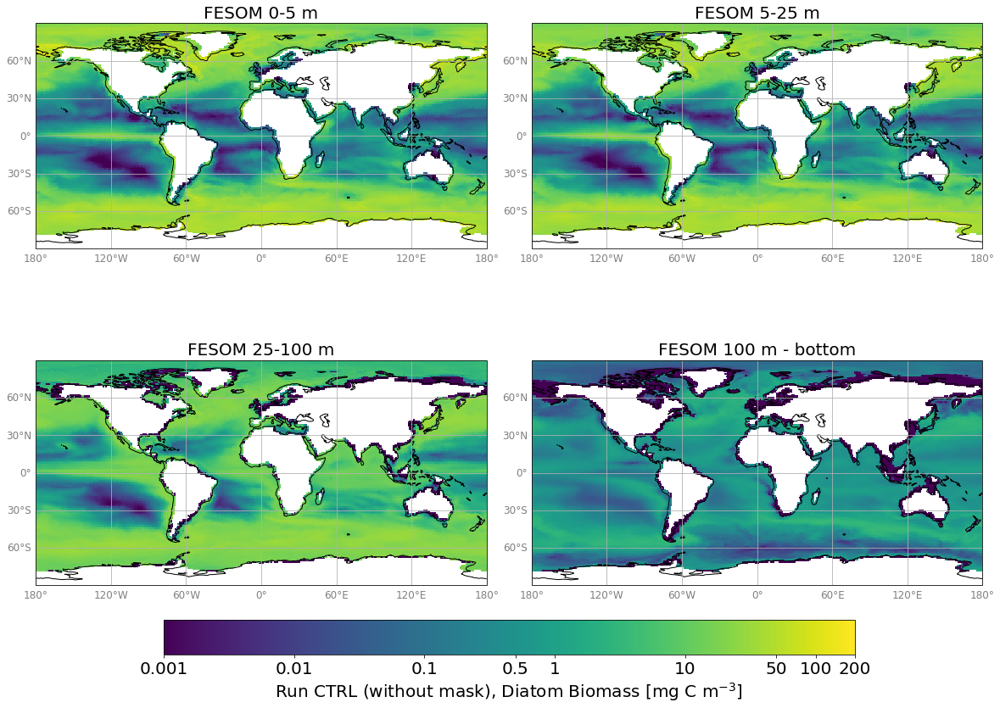

In [16]:
stx.fesom_plot_depths(mo4, figlabel[1], savelabel[1], lon_maredat, lat_maredat, 
                      mapproj, years, savefig=savefig, savepath=savepath)

k$_{Si}$ = 3.5


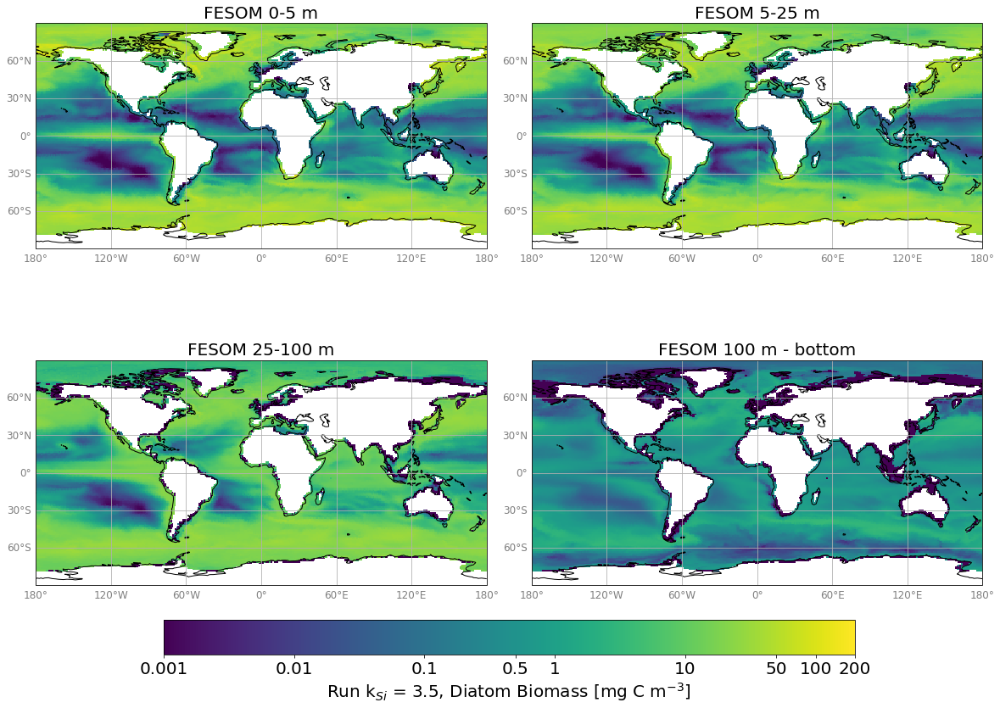

In [17]:
stx.fesom_plot_depths(mo6, figlabel[2], savelabel[2], lon_maredat, lat_maredat, 
                      mapproj, years, savefig=savefig, savepath=savepath)

k$_{Si}$ = 4.5


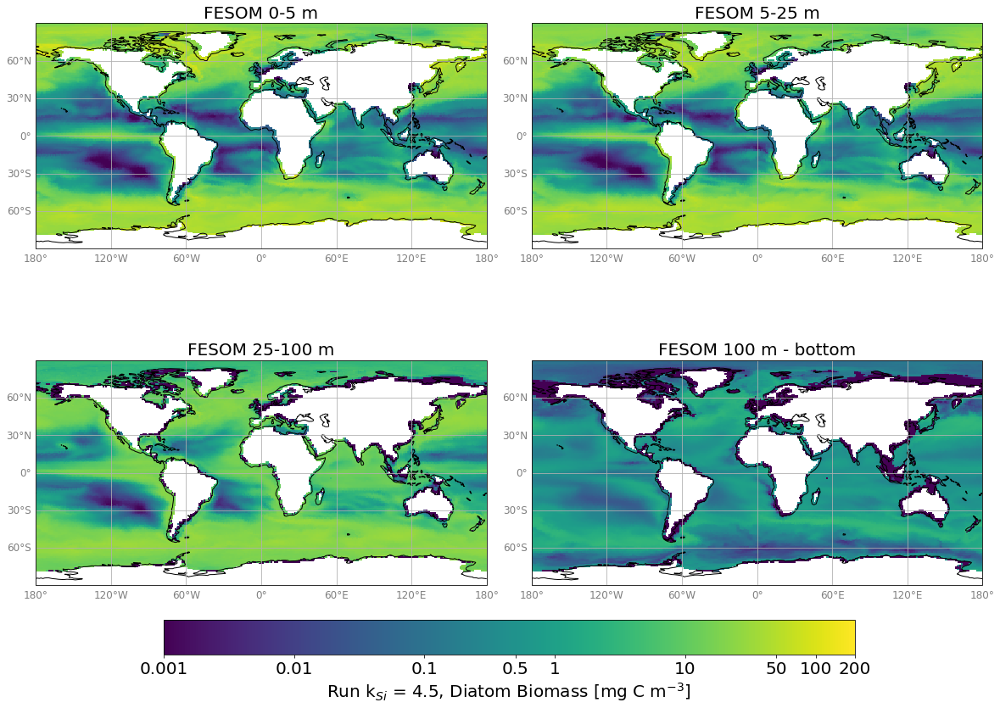

In [18]:
stx.fesom_plot_depths(mo7, figlabel[3], savelabel[3], lon_maredat, lat_maredat, 
                      mapproj, years, savefig=savefig, savepath=savepath)

# MarEDAT and FESOM side by side

CTRL (k$_{Si}$ = 4.0)


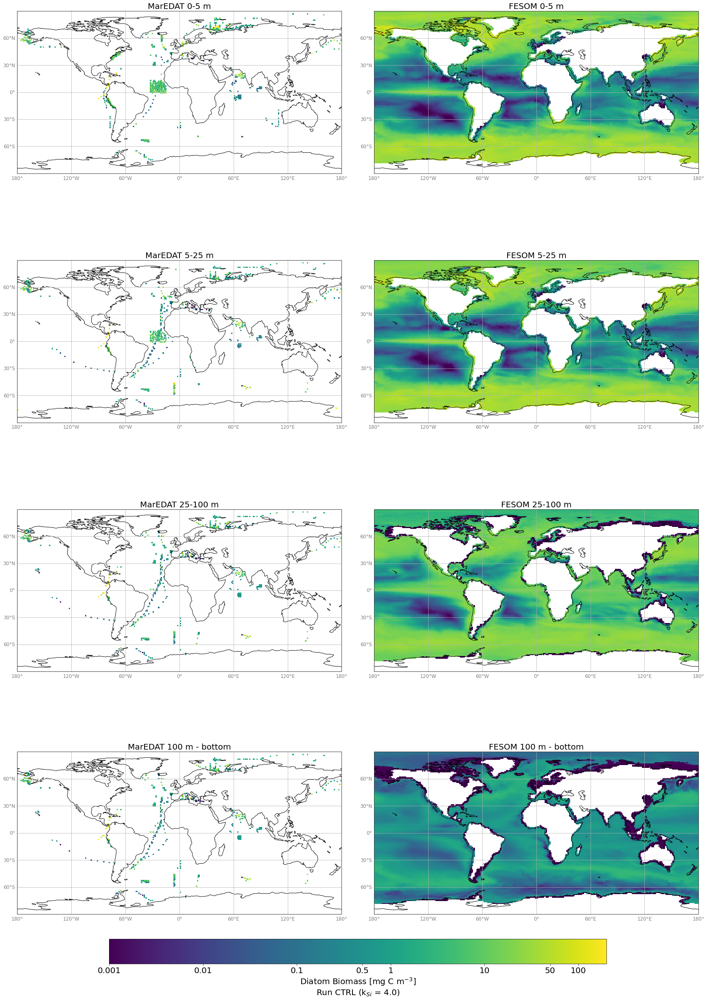

In [19]:
stx.plot_2cols(mo5,figlabel[0],savelabel[0], maredat_layered, lon_maredat, lat_maredat, mapproj, years, savefig, savepath)

CTRL (without mask)


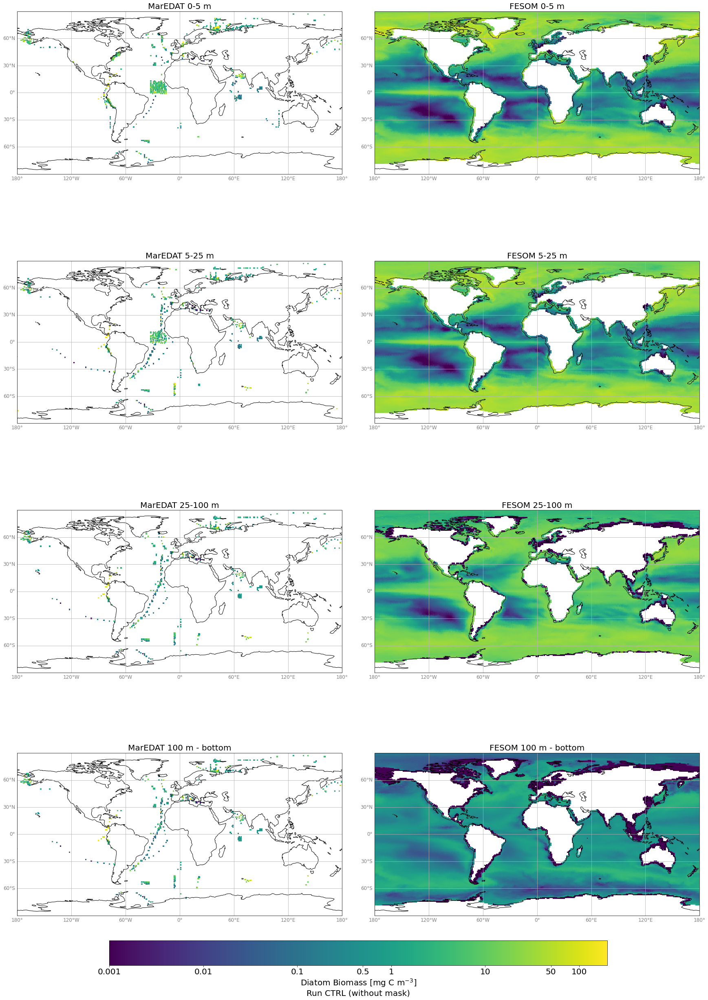

In [20]:
stx.plot_2cols(mo4,figlabel[1],savelabel[1], maredat_layered, lon_maredat, lat_maredat, mapproj, years, savefig, savepath)

k$_{Si}$ = 3.5


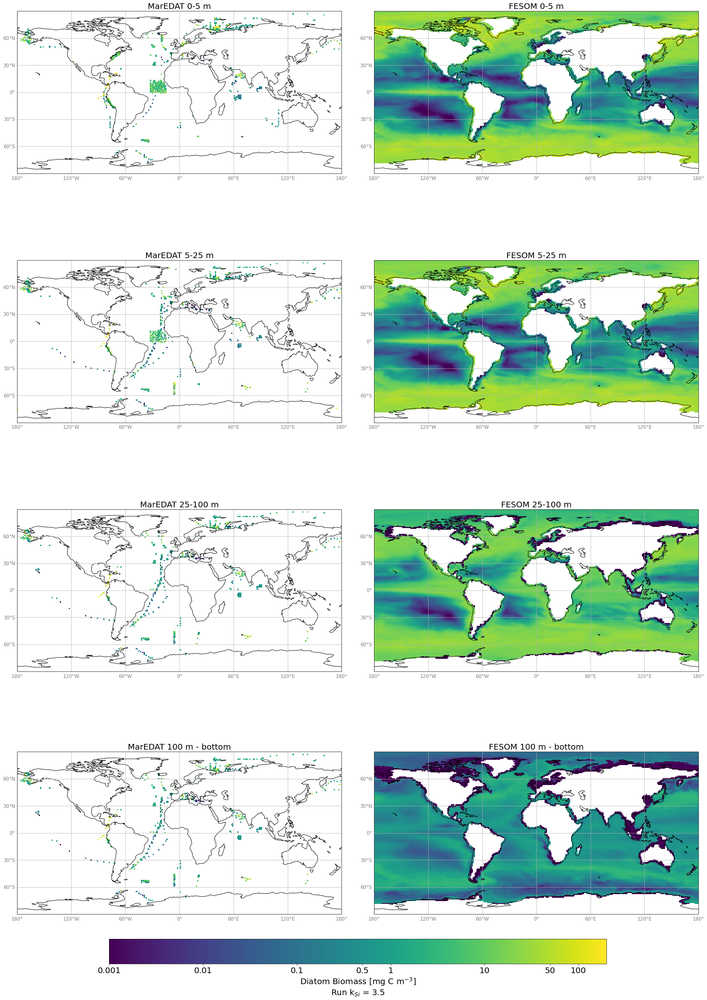

In [21]:
stx.plot_2cols(mo6,figlabel[2],savelabel[2], maredat_layered, lon_maredat, lat_maredat, mapproj, years, savefig, savepath)

k$_{Si}$ = 4.5


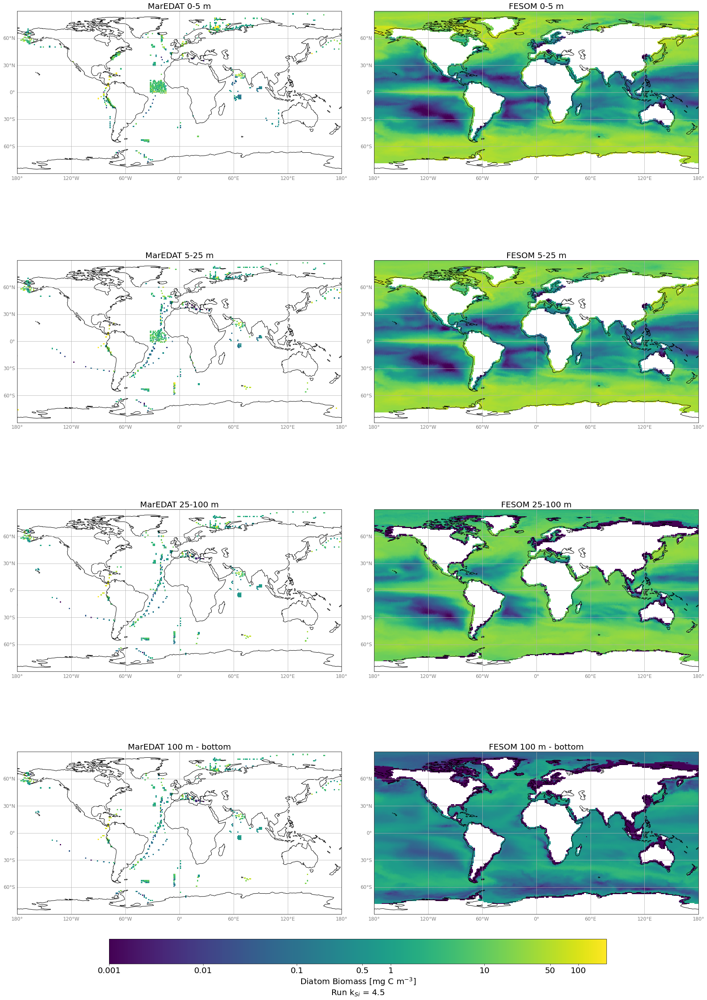

In [22]:
stx.plot_2cols(mo7,figlabel[3],savelabel[3], maredat_layered, lon_maredat, lat_maredat, mapproj, years, savefig, savepath)

# Prepare for statistics

### apply mask

In [23]:
# mask model where MarEDAT not available
mo5_ma = stx.mask_model_with_maredat(mo5,maredat_layered)
mo4_ma = stx.mask_model_with_maredat(mo4,maredat_layered)
mo6_ma = stx.mask_model_with_maredat(mo6,maredat_layered)
mo7_ma = stx.mask_model_with_maredat(mo7,maredat_layered)

#### CONTROL of masking for 0-5 m 


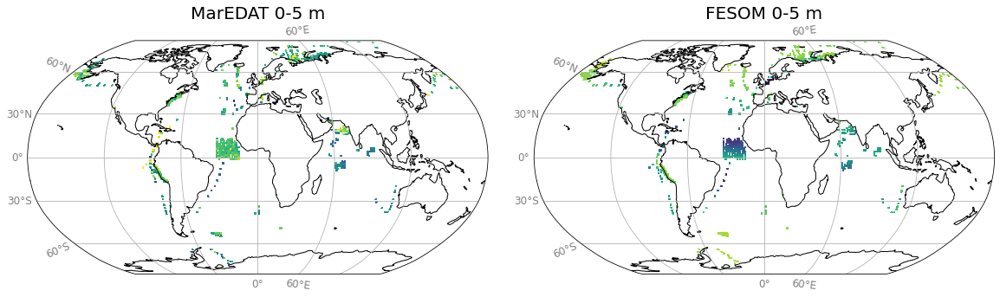

In [24]:
if True:
    fig, axes = plt.subplots(1,2, 
                             subplot_kw=dict(projection=ccrs.Robinson()),
                             gridspec_kw={'hspace': 0.001, 'wspace': 0.1},
                             figsize=(20,20))
    # 0-5 m maredat 
    m1 = axes[0]
    f1 = m1.pcolormesh(lon_maredat, lat_maredat, np.log10(maredat_layered[0]), 
                       transform = ccrs.PlateCarree(),
                        shading='flat', vmin=np.log10(0.001), vmax=np.log10(200), 
                        cmap=plt.cm.viridis)
    stx.mygrid(m1)
    m1.set_title('MarEDAT 0-5 m', fontsize=20)

    # FESOM 
    m1 = axes[1]
    f1 = m1.pcolormesh(lon_maredat, lat_maredat, np.log10(mo5_ma[0]), 
                       transform = ccrs.PlateCarree(),
                        shading='flat', vmin=np.log10(0.001), vmax=np.log10(200), 
                        cmap=plt.cm.viridis)
    stx.mygrid(m1)
    m1.set_title('FESOM 0-5 m', fontsize=20)

# Taylor statistics

In [25]:
depth_range = [0,5,25,100,'bot']

In [26]:
if False: #old
    fig, sdev, crmsd, ccoef = stx.plot_Taylor(maredat_layered[0],mo5_ma[0],
                        plot_depth = '0-5m')


Depth range 0-5 m

Original Taylor stats:
SDEV pred: 15.10340, ref: 189.26585
CRMS pred: 189.32419, ref: 0.00000
CORRCOEF: 0.03604

Normalized Taylor stats:
SDEV pred: 0.07980, ref: 1.00000
CRMS pred: 1.00031, ref: 0.00000
CORRCOEF: 0.03604

Depth range 5-25 m

Original Taylor stats:
SDEV pred: 14.19015, ref: 56.10948
CRMS pred: 57.98886, ref: 0.00000
CORRCOEF: -0.00821

Normalized Taylor stats:
SDEV pred: 0.25290, ref: 1.00000
CRMS pred: 1.03349, ref: 0.00000
CORRCOEF: -0.00821

Depth range 25-100 m

Original Taylor stats:
SDEV pred: 7.40933, ref: 45.58821
CRMS pred: 45.80103, ref: 0.00000
CORRCOEF: 0.05247

Normalized Taylor stats:
SDEV pred: 0.16253, ref: 1.00000
CRMS pred: 1.00467, ref: 0.00000
CORRCOEF: 0.05247

Depth range 100-bot m

Original Taylor stats:
SDEV pred: 0.48188, ref: 49.92118
CRMS pred: 49.94475, ref: 0.00000
CORRCOEF: -0.04409

Normalized Taylor stats:
SDEV pred: 0.00965, ref: 1.00000
CRMS pred: 1.00047, ref: 0.00000
CORRCOEF: -0.04409


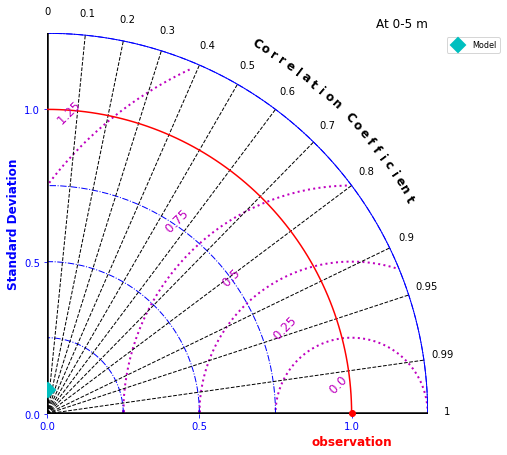

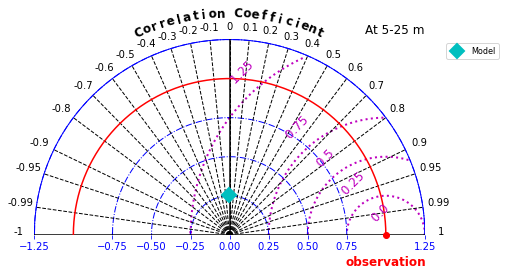

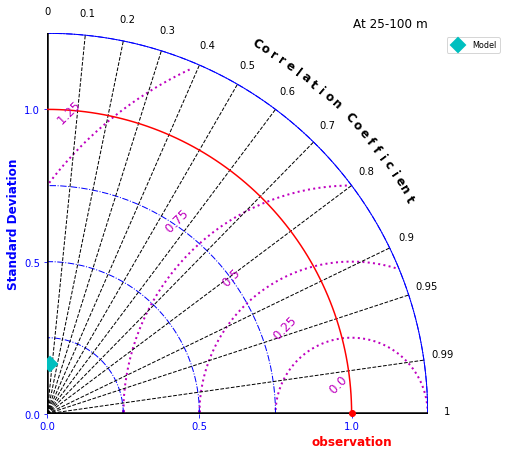

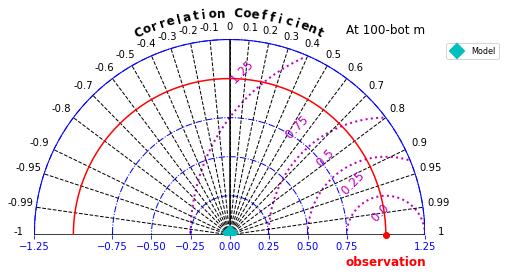

In [27]:
# print all runs at once
# mo5
fig, sdev, crmsd, ccoef_mo5 = stx.plot_Taylor_all_depths(maredat_layered,mo5_ma,depth_range)


Depth range 0-5 m

Original Taylor stats:
SDEV pred: 15.10967, ref: 189.26585
CRMS pred: 189.32599, ref: 0.00000
CORRCOEF: 0.03594

Normalized Taylor stats:
SDEV pred: 0.07983, ref: 1.00000
CRMS pred: 1.00032, ref: 0.00000
CORRCOEF: 0.03594

Depth range 5-25 m

Original Taylor stats:
SDEV pred: 14.20095, ref: 56.10948
CRMS pred: 57.98080, ref: 0.00000
CORRCOEF: -0.00742

Normalized Taylor stats:
SDEV pred: 0.25309, ref: 1.00000
CRMS pred: 1.03335, ref: 0.00000
CORRCOEF: -0.00742

Depth range 25-100 m

Original Taylor stats:
SDEV pred: 7.39129, ref: 45.58821
CRMS pred: 45.80682, ref: 0.00000
CORRCOEF: 0.05142

Normalized Taylor stats:
SDEV pred: 0.16213, ref: 1.00000
CRMS pred: 1.00480, ref: 0.00000
CORRCOEF: 0.05142

Depth range 100-bot m

Original Taylor stats:
SDEV pred: 0.48155, ref: 49.92118
CRMS pred: 49.94450, ref: 0.00000
CORRCOEF: -0.04362

Normalized Taylor stats:
SDEV pred: 0.00965, ref: 1.00000
CRMS pred: 1.00047, ref: 0.00000
CORRCOEF: -0.04362


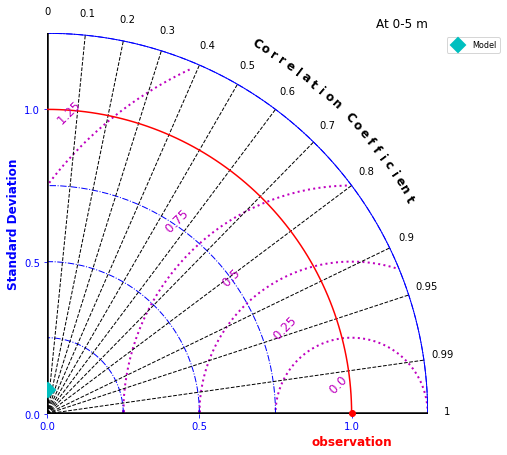

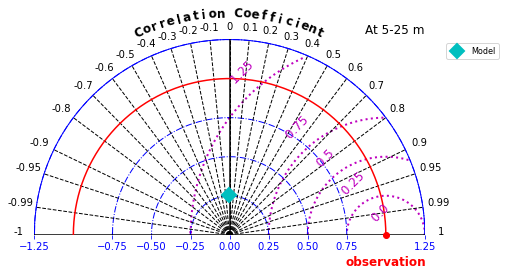

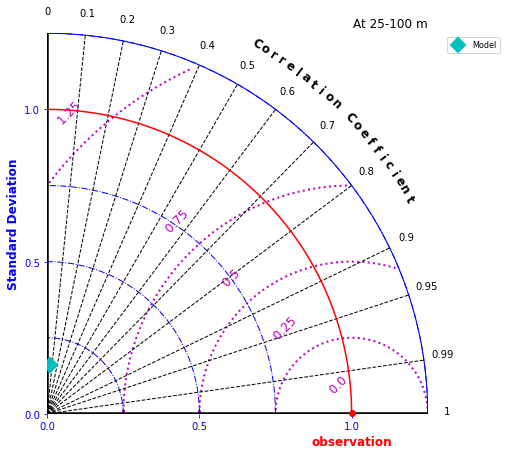

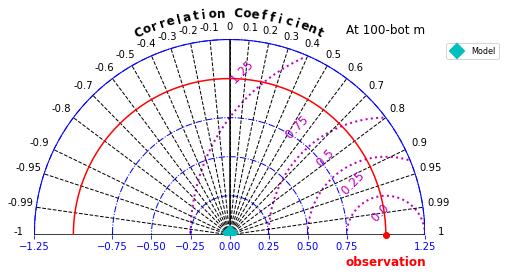

In [28]:
# mo4
fig, sdev, crmsd, ccoef_mo4 = stx.plot_Taylor_all_depths(maredat_layered,mo4_ma,depth_range)


Depth range 0-5 m

Original Taylor stats:
SDEV pred: 15.00845, ref: 189.26585
CRMS pred: 189.39309, ref: 0.00000
CORRCOEF: 0.03117

Normalized Taylor stats:
SDEV pred: 0.07930, ref: 1.00000
CRMS pred: 1.00067, ref: 0.00000
CORRCOEF: 0.03117

Depth range 5-25 m

Original Taylor stats:
SDEV pred: 14.16656, ref: 56.10948
CRMS pred: 57.97589, ref: 0.00000
CORRCOEF: -0.00770

Normalized Taylor stats:
SDEV pred: 0.25248, ref: 1.00000
CRMS pred: 1.03326, ref: 0.00000
CORRCOEF: -0.00770

Depth range 25-100 m

Original Taylor stats:
SDEV pred: 7.39160, ref: 45.58821
CRMS pred: 45.80459, ref: 0.00000
CORRCOEF: 0.05173

Normalized Taylor stats:
SDEV pred: 0.16214, ref: 1.00000
CRMS pred: 1.00475, ref: 0.00000
CORRCOEF: 0.05173

Depth range 100-bot m

Original Taylor stats:
SDEV pred: 0.48152, ref: 49.92118
CRMS pred: 49.94463, ref: 0.00000
CORRCOEF: -0.04389

Normalized Taylor stats:
SDEV pred: 0.00965, ref: 1.00000
CRMS pred: 1.00047, ref: 0.00000
CORRCOEF: -0.04389


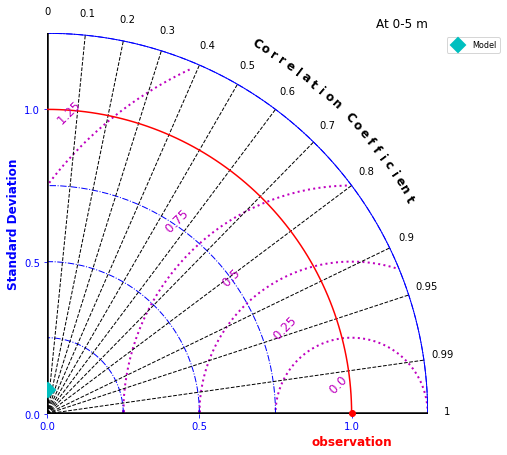

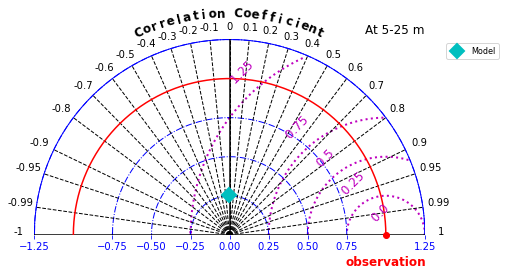

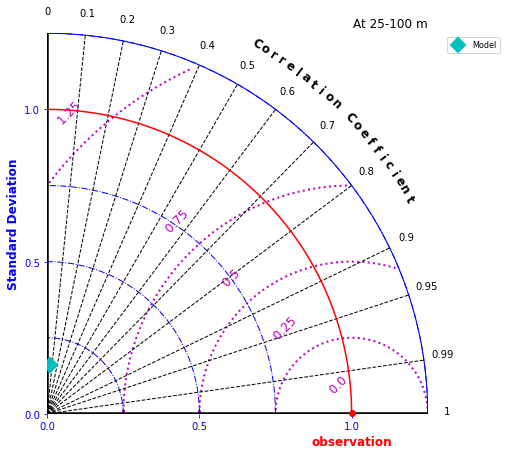

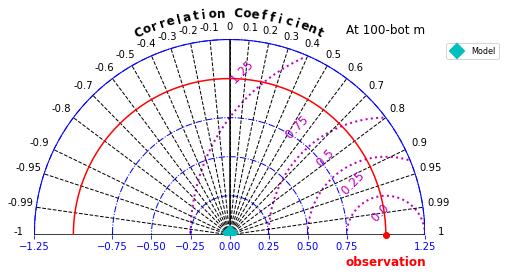

In [29]:
# mo6
fig, sdev, crmsd, ccoef_mo6 = stx.plot_Taylor_all_depths(maredat_layered,mo6_ma,depth_range)


Depth range 0-5 m

Original Taylor stats:
SDEV pred: 15.18994, ref: 189.26585
CRMS pred: 189.32934, ref: 0.00000
CORRCOEF: 0.03595

Normalized Taylor stats:
SDEV pred: 0.08026, ref: 1.00000
CRMS pred: 1.00034, ref: 0.00000
CORRCOEF: 0.03595

Depth range 5-25 m

Original Taylor stats:
SDEV pred: 14.26737, ref: 56.10948
CRMS pred: 58.00815, ref: 0.00000
CORRCOEF: -0.00819

Normalized Taylor stats:
SDEV pred: 0.25428, ref: 1.00000
CRMS pred: 1.03384, ref: 0.00000
CORRCOEF: -0.00819

Depth range 25-100 m

Original Taylor stats:
SDEV pred: 7.42143, ref: 45.58821
CRMS pred: 45.79342, ref: 0.00000
CORRCOEF: 0.05368

Normalized Taylor stats:
SDEV pred: 0.16279, ref: 1.00000
CRMS pred: 1.00450, ref: 0.00000
CORRCOEF: 0.05368

Depth range 100-bot m

Original Taylor stats:
SDEV pred: 0.48044, ref: 49.92118
CRMS pred: 49.94476, ref: 0.00000
CORRCOEF: -0.04429

Normalized Taylor stats:
SDEV pred: 0.00962, ref: 1.00000
CRMS pred: 1.00047, ref: 0.00000
CORRCOEF: -0.04429


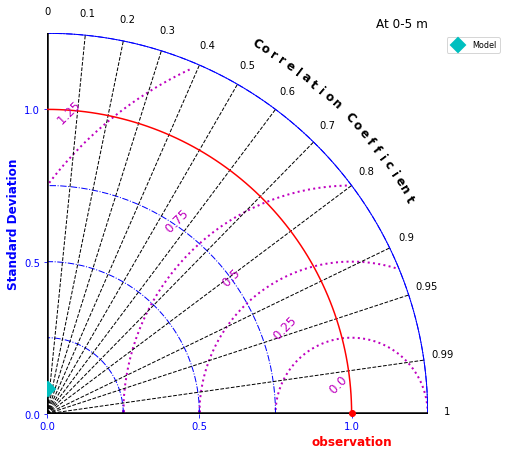

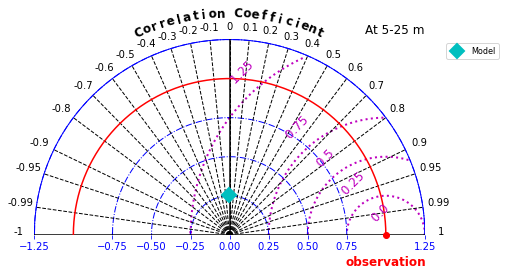

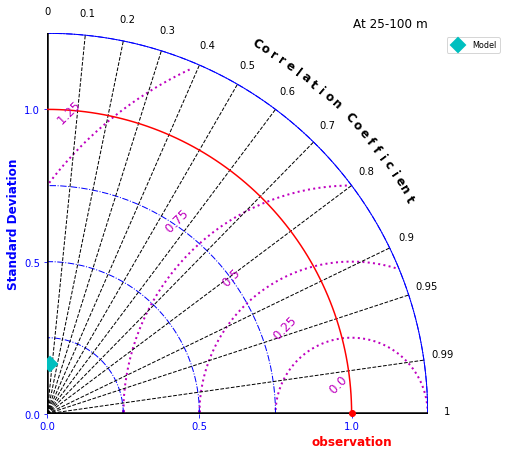

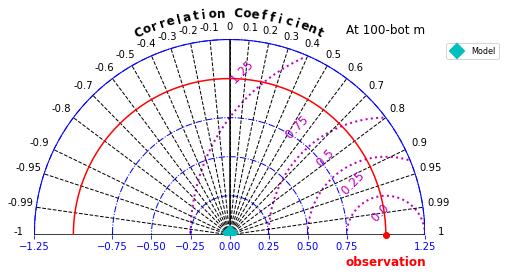

In [30]:
# mo7
fig, sdev, crmsd, ccoef_mo7 = stx.plot_Taylor_all_depths(maredat_layered,mo7_ma,depth_range)

# Scatter plots (as Miriam)

CTRL (k$_{Si}$ = 4.0)


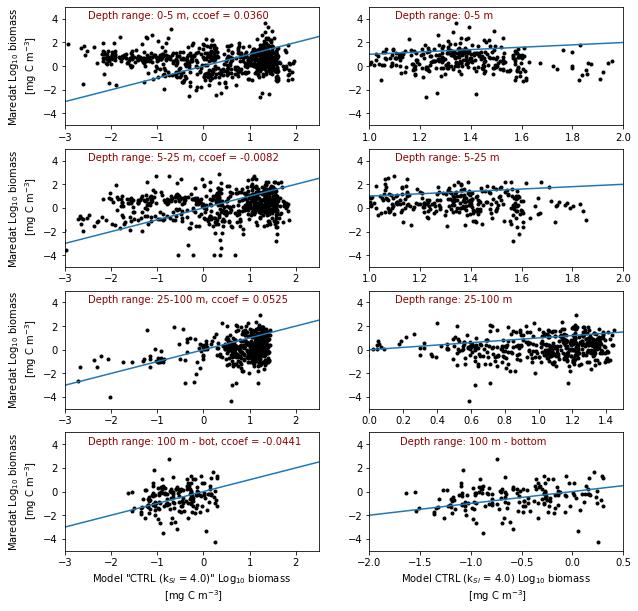

In [31]:
stx.plot_scatter(mo5_ma, figlabel[0], savelabel[0], maredat_layered, years, savefig, savepath, ccoef_mo5)

CTRL (without mask)


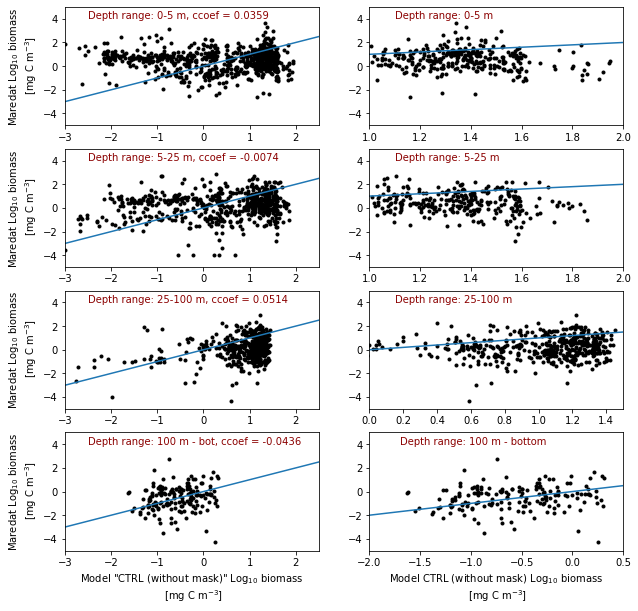

In [32]:
stx.plot_scatter(mo4_ma, figlabel[1], savelabel[1], maredat_layered, years, savefig, savepath, ccoef_mo4)


k$_{Si}$ = 3.5


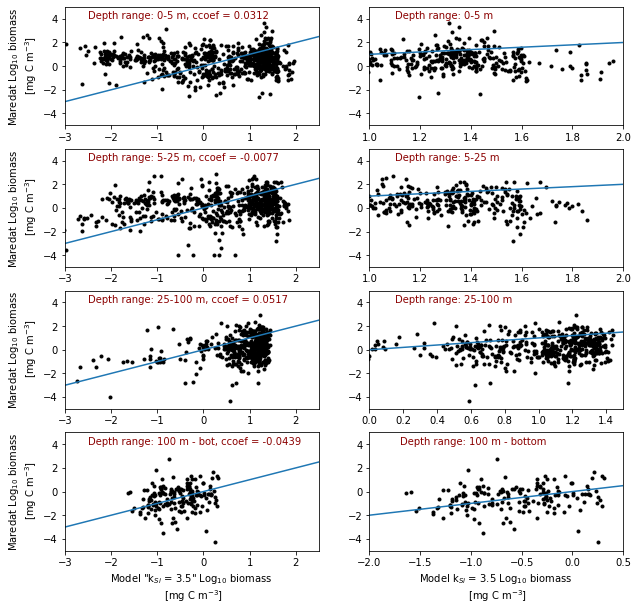

In [33]:
stx.plot_scatter(mo6_ma, figlabel[2], savelabel[2], maredat_layered, years, savefig, savepath, ccoef_mo6)


k$_{Si}$ = 4.5


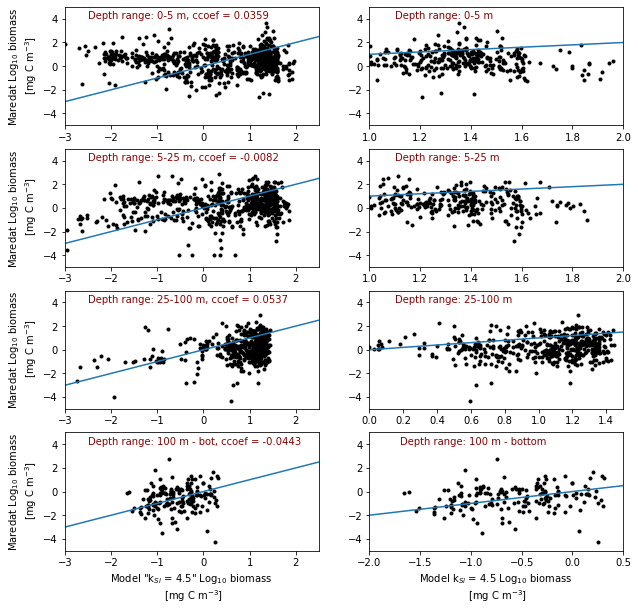

In [34]:
stx.plot_scatter(mo7_ma, figlabel[3], savelabel[3], maredat_layered, years, savefig, savepath, ccoef_mo7)


# Diatom silicate

Model depth: 0.0
Model depth: 0.0
Model depth: 0.0
Model depth: 0.0


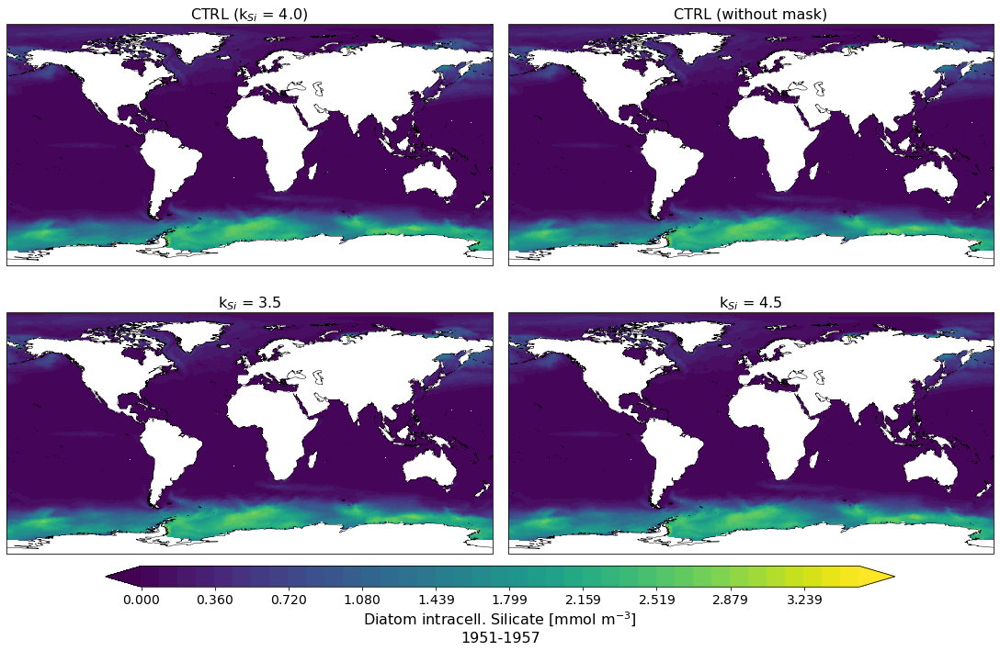

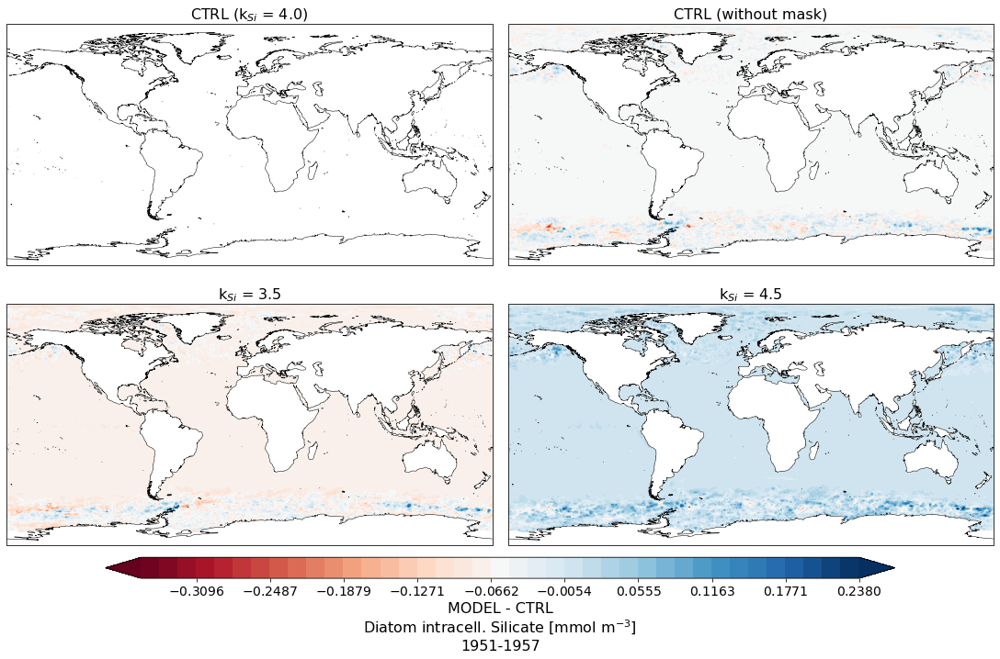

In [35]:
units = 'Diatom intracell. Silicate [mmol m$^{{-3}}$]\n{0}-{1}'.format(years[0],years[1])
#units = 'intracellular Si [mmol m$^{-3}$]'

DiaSi = [0]*len(idlist)

for i in range(len(idlist)):
    DiaSi[i] = pf.get_data(resultpath[i], "DiaSi", years, mesh, runid=idlist[i], how="mean", compute=True, depth=depth)

fig = pf.plot(mesh, [data for data in DiaSi], mapproj = mapproj, units=units, cmap = 'viridis',
              rowscol = rowscol, #(math.ceil(len(idlist)/3), 3), 
              figsize = (15,10),
              titles=[title for title in figlabel])

## differences
fig = pf.plot(mesh, [data-DiaSi[0] for data in DiaSi], mapproj = mapproj, units='MODEL - CTRL\n'+units, 
              rowscol = rowscol, #(math.ceil(len(idlist)/3), 3), 
              figsize = (15,10),
              #levels = (-2.5e-2,2.5e-2, 30), 
              cmap = 'RdBu',
              titles=[title for title in figlabel])

# Chl a

Model depth: 0.0
Model depth: 0.0
Model depth: 0.0
Model depth: 0.0


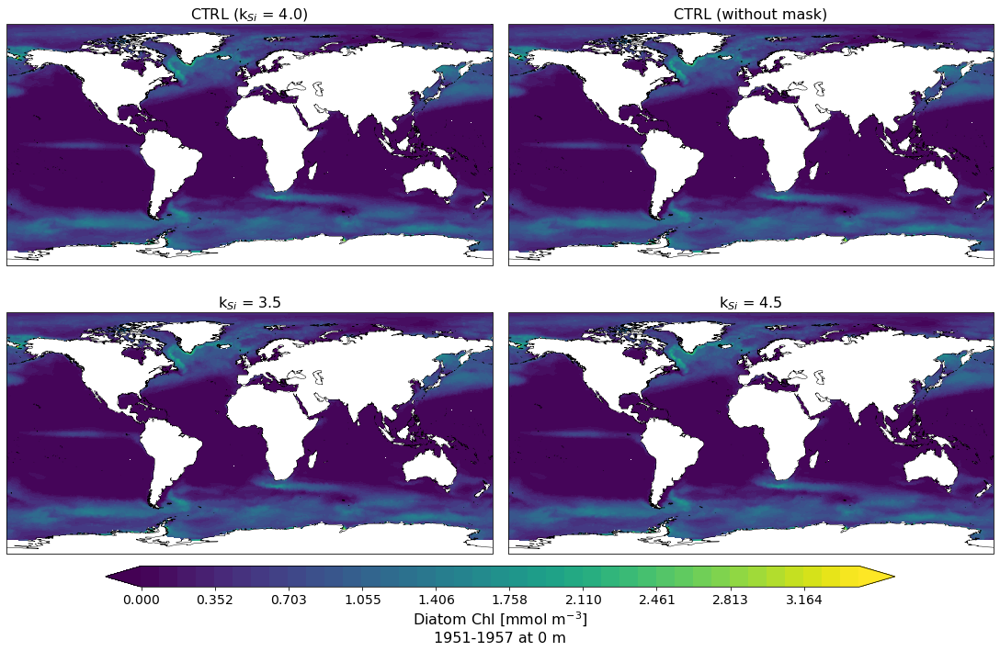

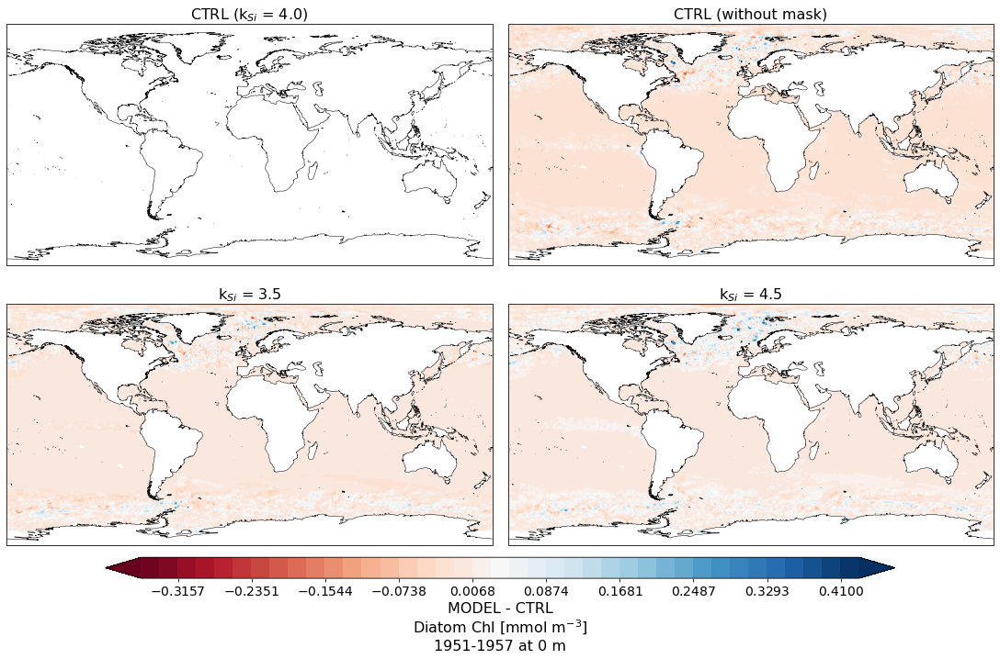

In [36]:
# diatom chlorophyll
#!ncdump -h $NCfesom
depth = 0

DiaChl = [0]*len(idlist)

units ='Diatom Chl [mmol m$^{{-3}}$]\n{0}-{1} at {2} m'.format(years[0],years[1],depth)
#units = 'Chl.a [mmol m$^{-3}$]'

for i in range(len(idlist)):
    DiaChl[i] = pf.get_data(resultpath[i], "DiaChl", years, mesh, runid=idlist[i], how="mean", 
                            compute=True, depth=depth)

fig = pf.plot(mesh, [data for data in DiaChl], mapproj = mapproj, units=units, cmap = 'viridis',
              rowscol = rowscol, #(math.ceil(len(idlist)/3), 3), 
              figsize = (15,10),
              titles=[title for title in figlabel])

fig = pf.plot(mesh, [data-DiaChl[0] for data in DiaChl], mapproj = mapproj, units='MODEL - CTRL\n'+units, 
              rowscol = rowscol, #(math.ceil(len(idlist)/3), 3), 
              figsize = (15,10),
              #levels = (-2.5e-5,2.5e-5, 30), 
              cmap = 'RdBu',
              titles=[title for title in figlabel])

# Map of total Diatom NPP 

Model depth: 0.0
Model depth: 0.0
Model depth: 0.0
Model depth: 0.0


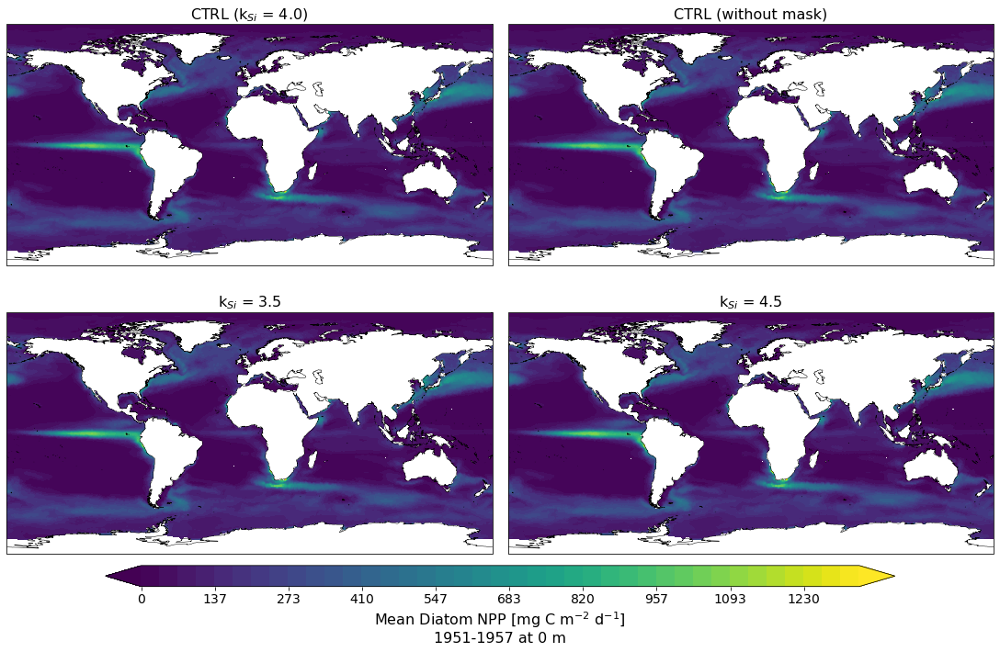

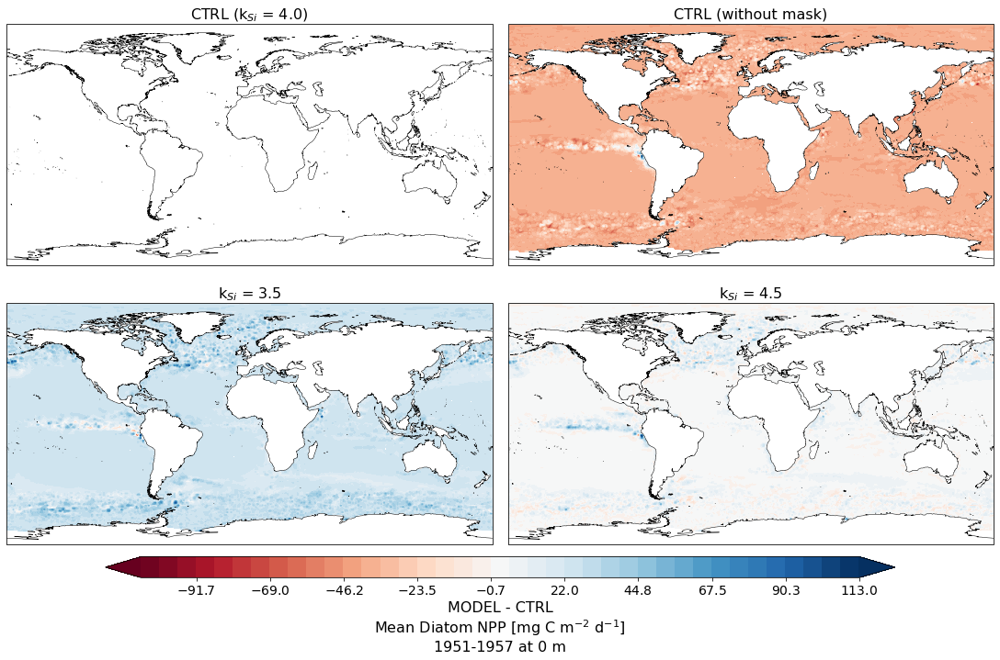

In [37]:
#NCfesom = resultpath + '/NPPd.mo1.1948.nc'
#!ncdump -h $NCfesom

depth = 0

# 12.01* data --> mg C/m2/d

units ='Mean Diatom NPP [mg C m$^{{-2}}$ d$^{{-1}}$]\n{0}-{1} at {2} m'.format(years[0],years[1],depth)
#units = 'Mean NPP [mg C m$^{-2}$ d$^{-1}$]'

NPPd = [0]*len(idlist)

for i in range(len(idlist)):
    NPPd[i] = pf.get_data(resultpath[i], "NPPd", years, mesh, runid=idlist[i], how="mean", compute=True, depth=depth)
    NPPd[i] = NPPd[i] * 12.01

fig = pf.plot(mesh, [data for data in NPPd], mapproj = mapproj, units=units, cmap = 'viridis',
              rowscol = rowscol, #(math.ceil(len(idlist)/3), 3), 
              figsize = (15,10),
              titles=[title for title in figlabel])

## differences
fig = pf.plot(mesh, [data-NPPd[0] for data in NPPd], mapproj = mapproj, units='MODEL - CTRL\n'+units, 
              rowscol = rowscol, #(math.ceil(len(idlist)/3), 3), 
              figsize = (15,10),
              #levels = (-2.5e-2,2.5e-2, 30), 
              cmap = 'RdBu',
              titles=[title for title in figlabel])

# Map of nanophytoplankton NPP

Model depth: 0.0
Model depth: 0.0
Model depth: 0.0
Model depth: 0.0


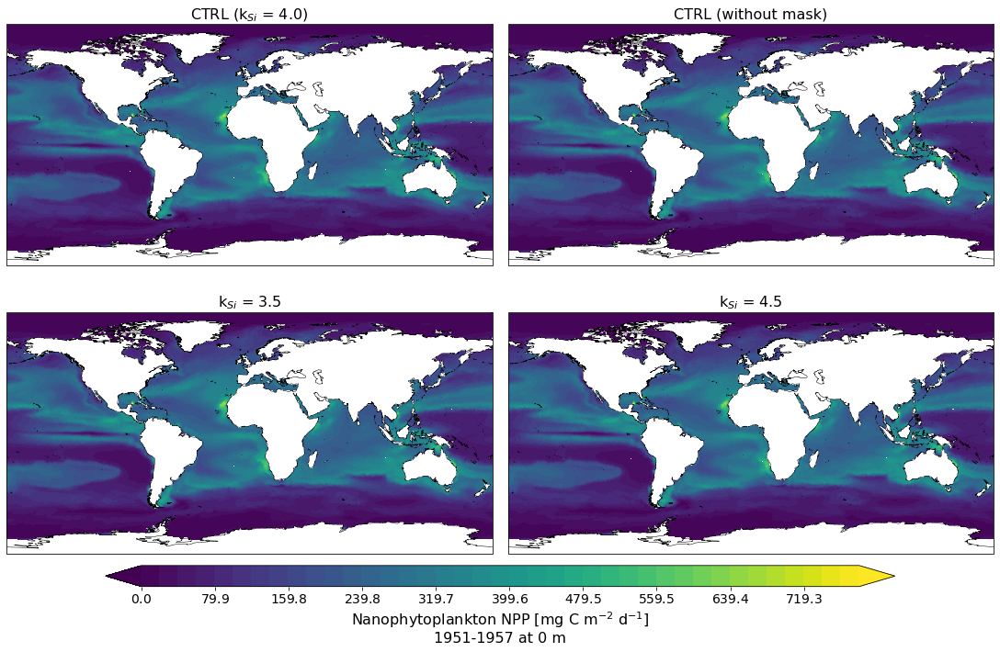

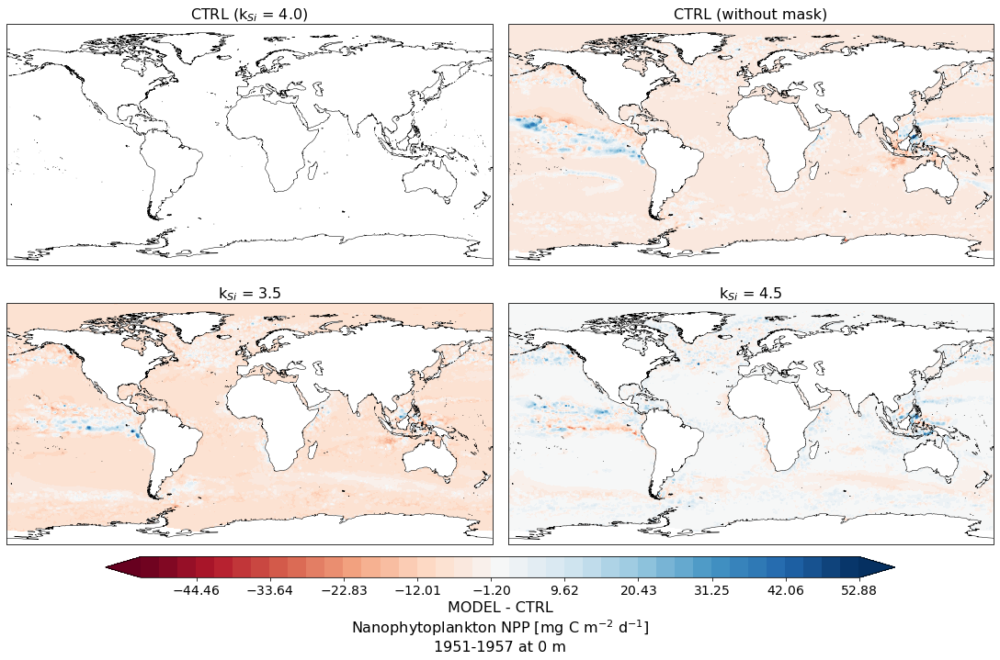

In [38]:
#NCfesom = resultpath + '/NPPn.mo1.1948.nc'
#!ncdump -h $NCfesom

# 12.01* data --> mg C/m2/d

units = 'Nanophytoplankton NPP [mg C m$^{{-2}}$ d$^{{-1}}$]\n{0}-{1} at {2} m'.format(years[0],years[1],depth)
#units = 'Mean NPP [mg C m$^{-2}$ d$^{-1}$]'

NPPn = [0]*len(idlist)

for i in range(len(idlist)):
    NPPn[i] = pf.get_data(resultpath[i], "NPPn", years, mesh, runid=idlist[i], how="mean", compute=True, depth=depth)
    NPPn[i] = NPPn[i] * 12.01

fig = pf.plot(mesh, [data for data in NPPn], mapproj = mapproj, units=units, cmap = 'viridis',
              rowscol = rowscol, #(math.ceil(len(idlist)/3), 3), 
              figsize = (15,10),
              titles=[title for title in figlabel])

## differences
fig = pf.plot(mesh, [data-NPPn[0] for data in NPPn], mapproj = mapproj, units='MODEL - CTRL\n'+units, 
              rowscol = rowscol, #(math.ceil(len(idlist)/3), 3), 
              figsize = (15,10),
              #levels = (-30,30, 30), 
              cmap = 'RdBu',
              titles=[title for title in figlabel])

# Total NPP

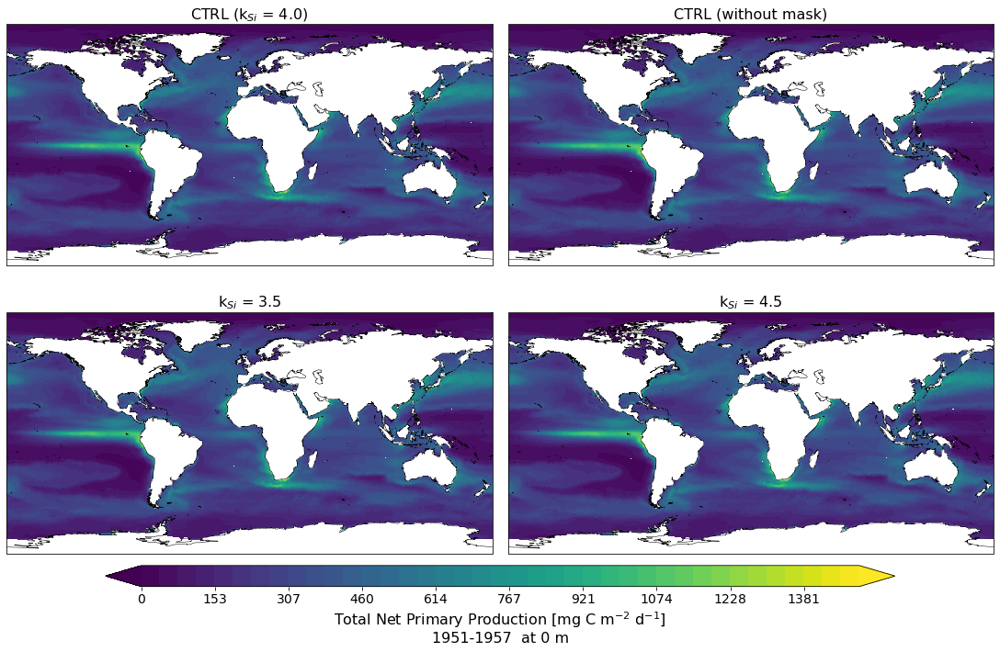

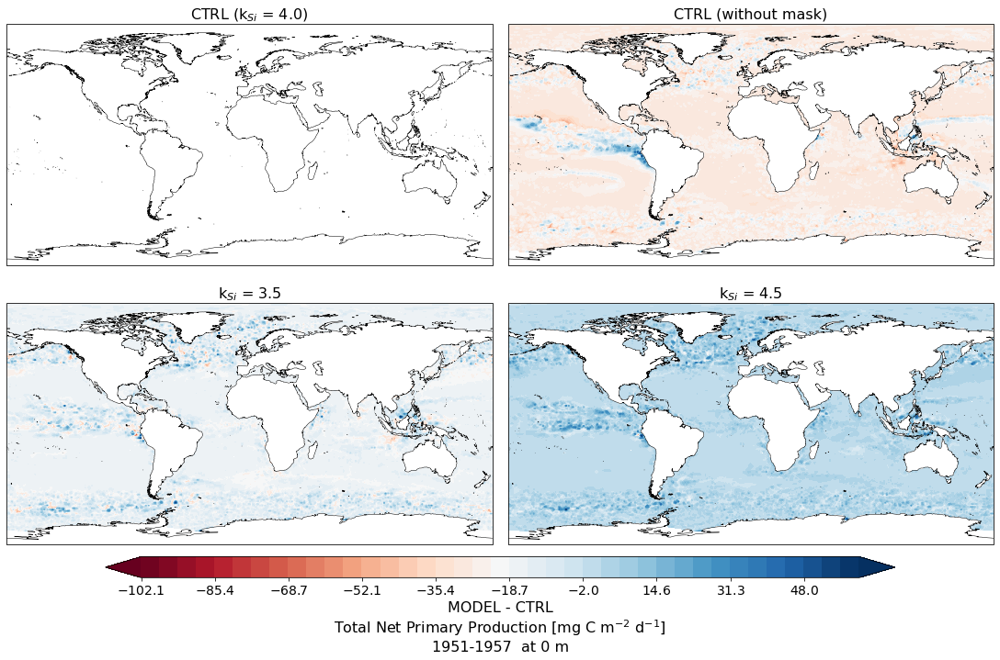

In [39]:
units ='Total Net Primary Production [mg C m$^{{-2}}$ d$^{{-1}}$]\n{0}-{1}  at {2} m'.format(years[0],years[1],depth)
#units = 'Mean total NPP [mg C m$^{-2}$ d$^{-1}$]'

NPPtot = [NPPd[i] + NPPn[i] for i in range(len(idlist))]

fig = pf.plot(mesh, [data for data in NPPtot], mapproj = mapproj, units=units, cmap = 'viridis',
              rowscol = rowscol, #(math.ceil(len(idlist)/3), 3), 
              figsize = (15,10),
              titles=[title for title in figlabel])

## differences
fig = pf.plot(mesh, [data-NPPtot[0] for data in NPPtot], mapproj = mapproj, units='MODEL - CTRL\n'+units, 
              rowscol = rowscol, #(math.ceil(len(idlist)/3), 3), 
              figsize = (15,10),
              #levels = (-2.5e-1,2.5e-1, 30), 
              cmap = 'RdBu',
              titles=[title for title in figlabel])

# Nutrients

In [40]:
from DIN_WOA_Comparison_python3 import DINcomp

In [41]:
# check DIN comp to WOA FOR CONTROL RUN

#ctrl = DINcomp('fesom',resultpath[0],savepath,meshpath,ncfileDIN,first_year,last_year,mapproj=mapproj)

#### compare each FESOM run with WOA DIN


****************************** 
ANALYSING /work/ollie/mozeisin/results/f2r1.2/mo5 
******************************
***
Loading WOA file: /work/ollie/projects/MarESys/evaluation/woa13_all_n00_01.nc
***
***
Depth greater in FESOM (-6125.0) than in WOA (-5500.0)
Please consider choosing max depth level 43 with max depth at -5275.0!
***

Plotting DIN as mean over depth
FESOM min = 0.005001543555408716, max = 34.446075439453125
WOA min = 0.0005629408827170412, max = 34.985260415584484


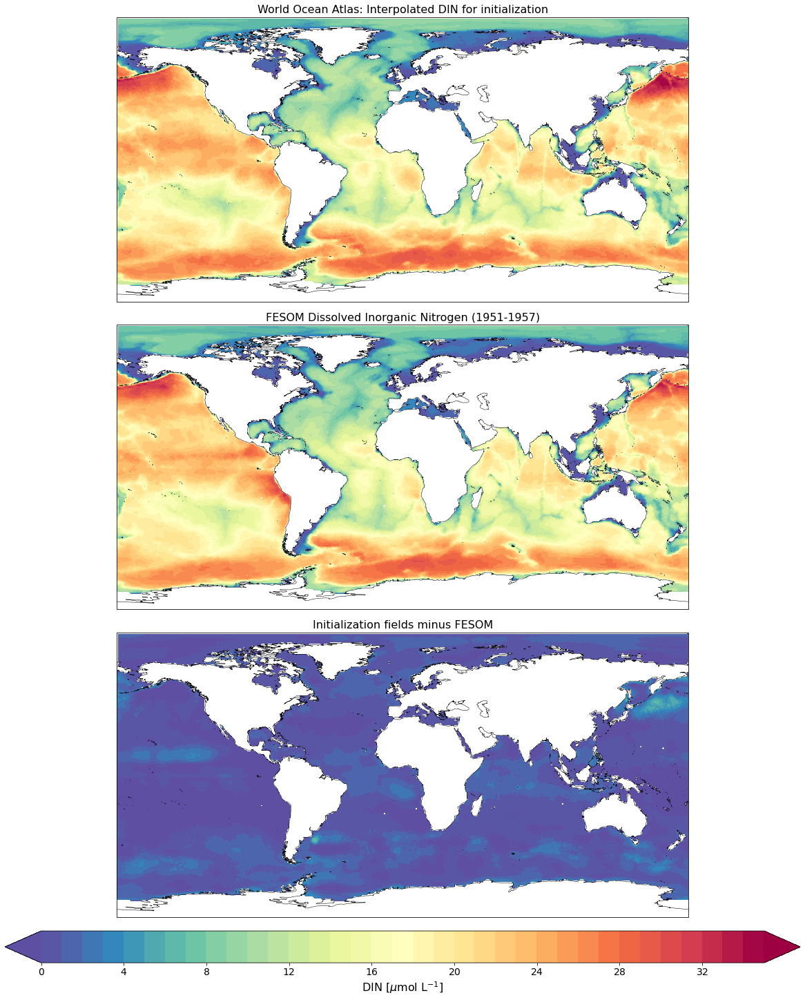


Original Taylor stats:
SDEV pred: 9.34042, ref: 9.27727
CRMS pred: 1.06131, ref: 0.00000
CORRCOEF: 0.99352

Normalized Taylor stats:
SDEV pred: 1.00681, ref: 1.00000
CRMS pred: 0.11440, ref: 0.00000
CORRCOEF: 0.99352


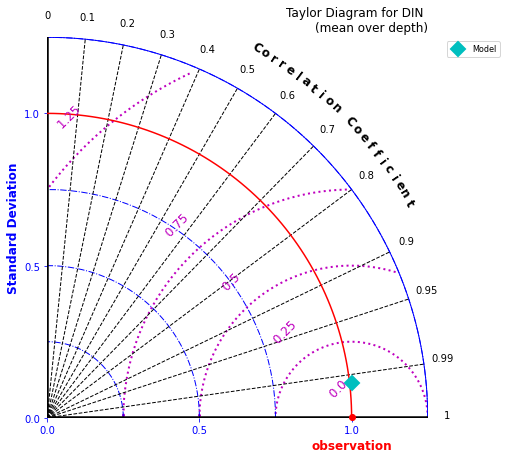


****************************** 
ANALYSING /work/ollie/mozeisin/results/f2r1.2/mo4 
******************************
***
Loading WOA file: /work/ollie/projects/MarESys/evaluation/woa13_all_n00_01.nc
***
***
Depth greater in FESOM (-6125.0) than in WOA (-5500.0)
Please consider choosing max depth level 43 with max depth at -5275.0!
***

Plotting DIN as mean over depth
FESOM min = 0.0050060502253472805, max = 34.254878997802734
WOA min = 0.0005629408827170412, max = 34.985260415584484


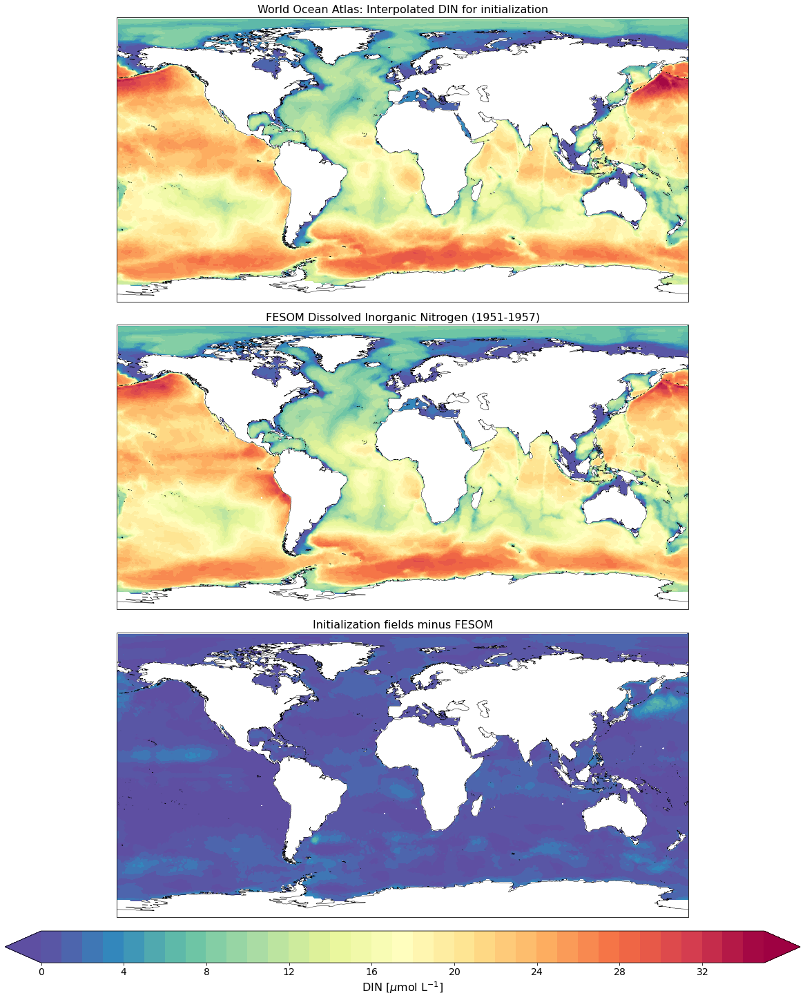


Original Taylor stats:
SDEV pred: 9.33814, ref: 9.27727
CRMS pred: 1.06585, ref: 0.00000
CORRCOEF: 0.99346

Normalized Taylor stats:
SDEV pred: 1.00656, ref: 1.00000
CRMS pred: 0.11489, ref: 0.00000
CORRCOEF: 0.99346


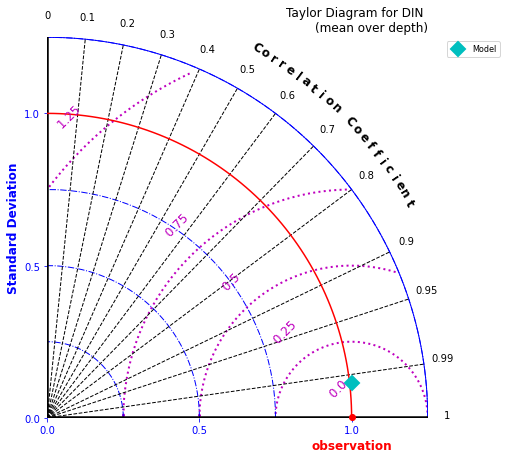


****************************** 
ANALYSING /work/ollie/mozeisin/results/f2r1.2/mo10 
******************************
***
Loading WOA file: /work/ollie/projects/MarESys/evaluation/woa13_all_n00_01.nc
***
***
Depth greater in FESOM (-6125.0) than in WOA (-5500.0)
Please consider choosing max depth level 43 with max depth at -5275.0!
***

Plotting DIN as mean over depth
FESOM min = 0.005023558624088764, max = 34.44731903076172
WOA min = 0.0005629408827170412, max = 34.985260415584484


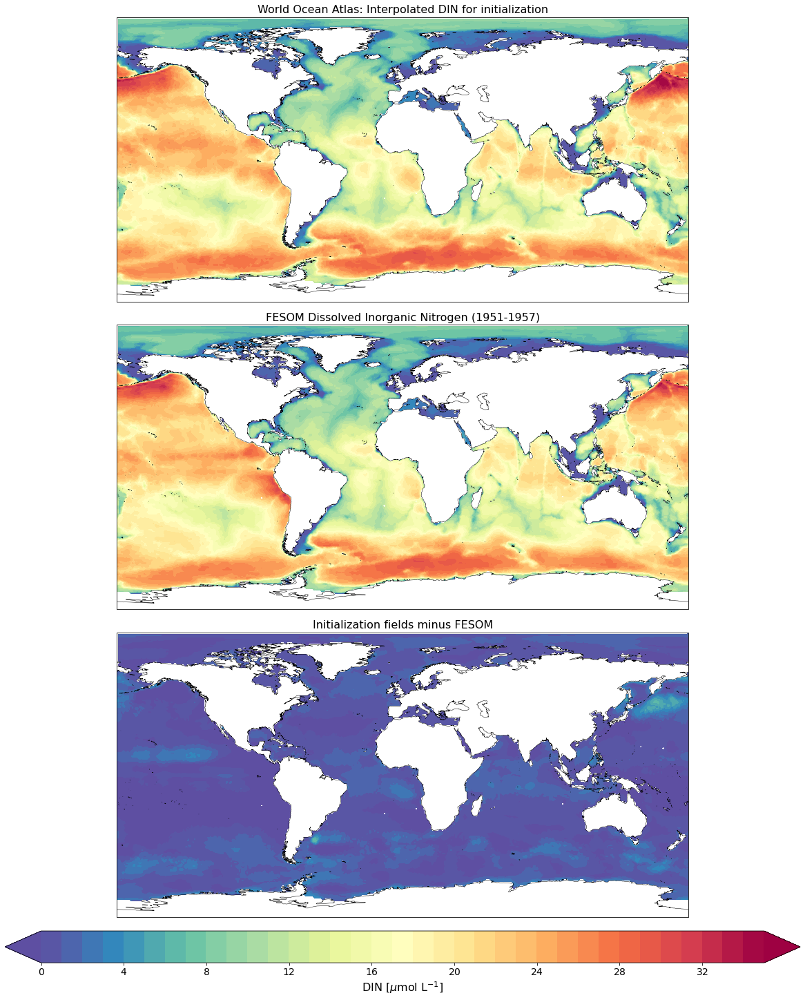


Original Taylor stats:
SDEV pred: 9.34173, ref: 9.27727
CRMS pred: 1.06252, ref: 0.00000
CORRCOEF: 0.99351

Normalized Taylor stats:
SDEV pred: 1.00695, ref: 1.00000
CRMS pred: 0.11453, ref: 0.00000
CORRCOEF: 0.99351


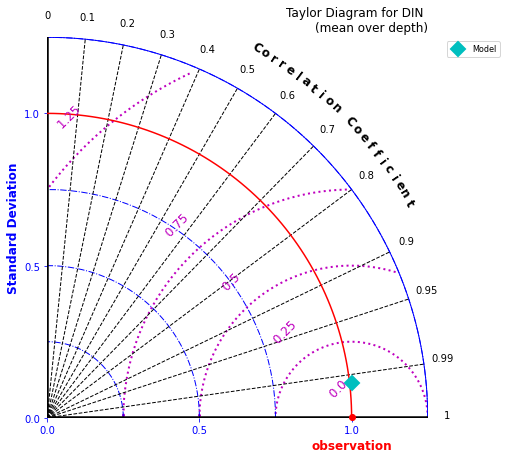


****************************** 
ANALYSING /work/ollie/mozeisin/results/f2r1.2/mo11 
******************************
***
Loading WOA file: /work/ollie/projects/MarESys/evaluation/woa13_all_n00_01.nc
***
***
Depth greater in FESOM (-6125.0) than in WOA (-5500.0)
Please consider choosing max depth level 43 with max depth at -5275.0!
***

Plotting DIN as mean over depth
FESOM min = 0.005004760809242725, max = 34.287872314453125
WOA min = 0.0005629408827170412, max = 34.985260415584484


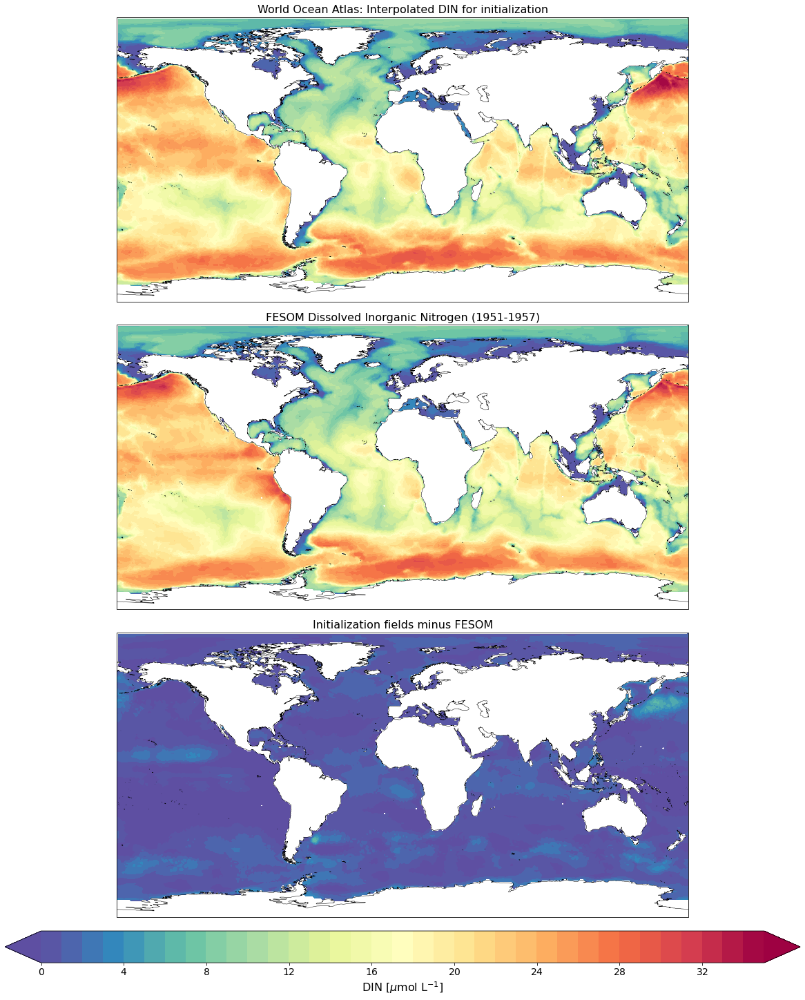


Original Taylor stats:
SDEV pred: 9.33865, ref: 9.27727
CRMS pred: 1.06175, ref: 0.00000
CORRCOEF: 0.99352

Normalized Taylor stats:
SDEV pred: 1.00662, ref: 1.00000
CRMS pred: 0.11445, ref: 0.00000
CORRCOEF: 0.99352


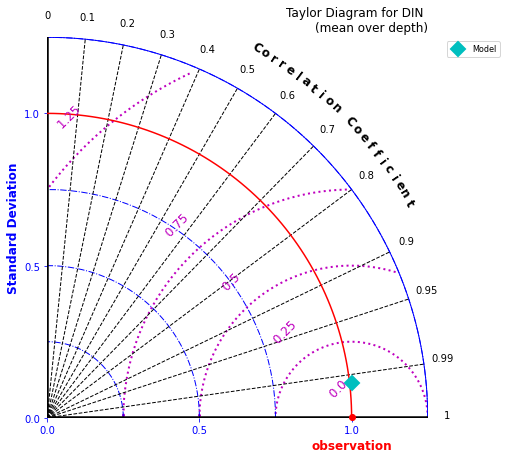

In [42]:
# run DINcomp for each result
if True:
    for i in range(len(resultpath)):
        print('\n****************************** \nANALYSING {0} \n******************************'.format(resultpath[i]))
        fig = DINcomp(idlist[i],resultpath[i],savepath,meshpath,ncfileDIN,first_year,last_year,mapproj=mapproj)

## Transect

#### Atlantic :  Diatom Chl

<GeoAxesSubplot:>

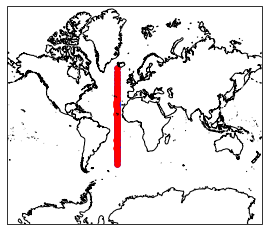

In [43]:
lon_start = -25
lat_start = -50
lon_end = -25
lat_end = 65
npoints   = 50
lonlat = pf.transect_get_lonlat(lon_start, lat_start, lon_end, lat_end, npoints)

pf.plot_transect_map(lonlat, mesh)

#### load FESOM 3d DiaC data

In [44]:
#load 3D data
DiaC_3d = [0]*len(idlist)

for i in range(len(idlist)):
    print(resultpath[i])
    DiaC_3d_aux = pf.get_data(resultpath[i], "DiaC", years, mesh, runid=idlist[i], how="mean")
    DiaC_3d[i] = DiaC_3d_aux * 12.01


/work/ollie/mozeisin/results/f2r1.2/mo5
Depth is None, 3d field will be returned
/work/ollie/mozeisin/results/f2r1.2/mo4
Depth is None, 3d field will be returned
/work/ollie/mozeisin/results/f2r1.2/mo10
Depth is None, 3d field will be returned
/work/ollie/mozeisin/results/f2r1.2/mo11
Depth is None, 3d field will be returned


Atlantic Transect, mean of 1951-1957


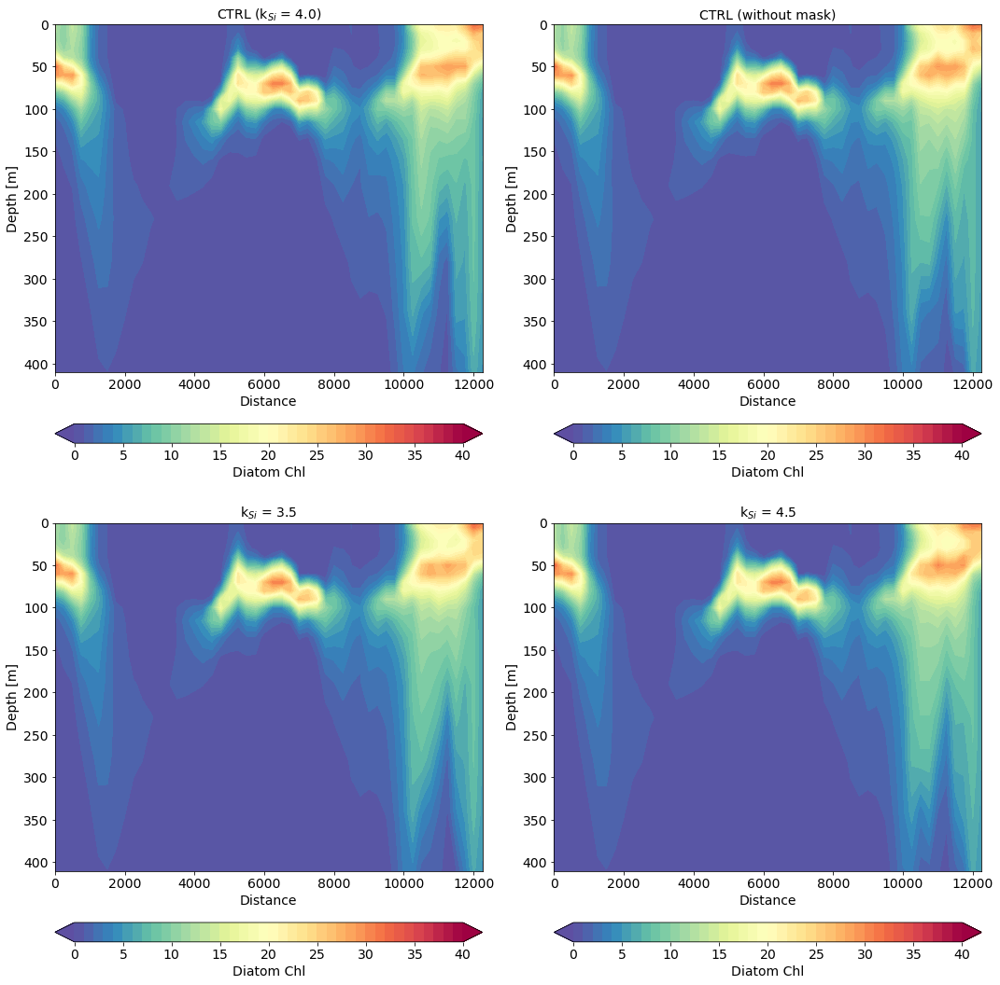

In [45]:
print('Atlantic Transect, mean of {0}-{1}'.format(years[0],years[1]))

dist, transect_data = pf.get_transect(DiaC_3d[0],mesh,lonlat)
dist2, transect_data2 = pf.get_transect(DiaC_3d[1],mesh,lonlat)
dist3, transect_data3 = pf.get_transect(DiaC_3d[2],mesh,lonlat)
dist4, transect_data4 = pf.get_transect(DiaC_3d[3],mesh,lonlat)


pf.plot_xyz(mesh, 
            [transect_data,transect_data2,transect_data3,transect_data4],
            dist,
            maxdepth=500,
            ncols=2,
            xlabel='Distance',
            label='Diatom Chl',
            title=[l for l in figlabel],
            levels=np.linspace(0,40,41),#cmap=cm.hot_r,
            figsize=(15, 15))


# Other evaluation

## Bracher et al. (2019) PS106


In [46]:
if False:
    # import from PANGAEA
    ds= pd.PanDataSet(899284)
    print(ds.title)
    # Chl a in µg/L

    PS106 = ds.data

    #print(np.shape(PS106), type(PS106))

    if False: # first overview plot
        fig_PS106 = PS106.plot(kind='scatter', x='Longitude', y='Latitude',
              c='Chl a diatoms', cmap=plt.get_cmap("jet"), colorbar=True,
              figsize = (10,7))

    #### plot with cartopy

    # defining projections
    og = ccrs.Orthographic(0,90)
    pc = ccrs.PlateCarree()

    PS106_Chla_dia = PS106['Chl a diatoms']
    lat, lon = PS106['Latitude'], PS106['Longitude']

    fig = plt.figure(figsize=(20, 16))
    ax = plt.axes(projection=og)
    ax.coastlines()
    ax.gridlines()
    plt.scatter(lon, lat, transform = pc, 
        c=PS106_Chla_dia, cmap=plt.get_cmap("jet"))
    ax.set_extent([-20, 50, 60, 90])
    ax.stock_img()
    plt.xlabel('longitude')
    plt.ylabel('latitude')
    plt.title('PS106 Diatom Chlorophyll a  (Bracher et al., 2019)')
    plt.colorbar(label='Diatom Chl.a [µg/L]')
    #plt.clim(0, 10)

## Evaluation scripts from pyfesom 2

#### Diatom Chla integrals

In [47]:
DiaChl = pf.get_data(resultpath[0], 'DiaChl', years, mesh, runid=idlist[0], how=None, compute=False)

Depth is None, 3d field will be returned


In [48]:
#pf.volmean_data?
DiaChl_volmean = pf.volmean_data(DiaChl, mesh)

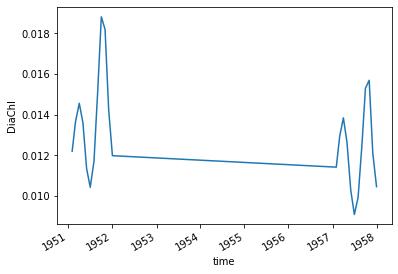

In [49]:
DiaChl_volmean.plot()

# Export to HTML

In [ ]:
%autosave 2

time.sleep(15)

# convert without input (code)
!jupyter nbconvert MZ_F2R_sensitivity_runs_varkSi.ipynb --output-dir=$htmlpath --output $htmlname --to html --no-input

Autosaving every 2 seconds
